First we import some libraries

In [14]:
import torch 
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

In [15]:
def show_tensor_images(image_tensor, num_images=25, size=(1,28,28)):
    
    ## function for visualizing image tensors
    
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1,2,0).squeeze())
    plt.show()

Function for creating noise

In [16]:
def get_noise(n_samples, z_dim, device='cpu'):
    return torch.randn(n_samples, z_dim, device=device)

Generator

In [17]:
def get_generator_block(input_dim, output_dim):
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True)
    )

In [18]:
class Generator(nn.Module):
    
    def __init__(self, z_dim, im_dim = 784, hidden_dim=128):
        super(Generator, self).__init__()
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim*2),
            get_generator_block(hidden_dim*2, hidden_dim*4),
            get_generator_block(hidden_dim*4, hidden_dim*8),
            nn.Linear(hidden_dim*8, im_dim),
            nn.Sigmoid()
        )
     
    def forward(self, noise):
        return self.gen(noise)

In [19]:
##gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    
    noise = get_noise(num_images, z_dim, device=device)
    
    fake_image = gen(noise)
    disc_fake = disc(fake_image)
    
    gen_loss = criterion(disc_fake, torch.ones_like(disc_fake))
    
    return gen_loss

Discriminator

In [20]:
def get_discriminator_block(input_dim, output_dim):
    
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2)
    )

In [21]:
class Discriminator(nn.Module):
    
    def __init__(self, im_dim=784, hidden_dim= 128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            get_discriminator_block(hidden_dim, 1)
        )
    def forward(self, image):
        return self.disc(image)

In [22]:
## disc loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    ## real : batch of real images
    ## num_images : the number of images the generator should produce, 
    # which is also the length of the real images
    
    noise = get_noise(num_images, z_dim, device = device)
    
    fake_img = gen(noise)
    disc_pred_fake = disc(fake_img.detach())
    disc_loss_fake = criterion(disc_pred_fake, torch.zeros_like(disc_pred_fake))
    
    disc_pred_real = disc(real)
    disc_loss_real = criterion(disc_pred_real, torch.ones_like(disc_pred_real))
    
    disc_loss = (disc_loss_fake + disc_loss_real) / 2
    
    return disc_loss

Training

In [23]:
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

## load mnist dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=False, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

device = 'cuda'

In [24]:
## initialzing generator, discriminator and optimizer
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)

disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500 : Generator loss: 0.7912322036027903, Discriminator loss : 0.4058343455195428, cur_batch_size : 128


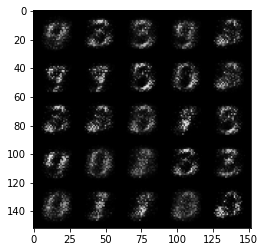

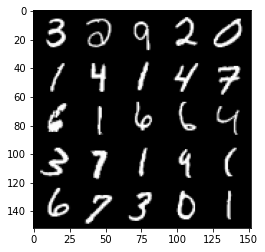

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000 : Generator loss: 1.623413863182068, Discriminator loss : 0.358276158988476, cur_batch_size : 128


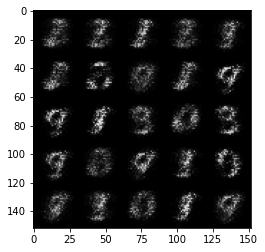

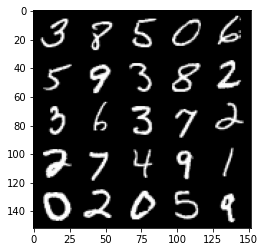

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500 : Generator loss: 2.5463655329942694, Discriminator loss : 0.3041779906749723, cur_batch_size : 128


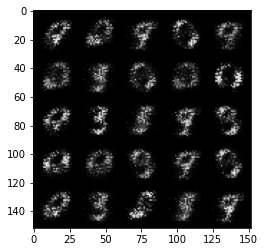

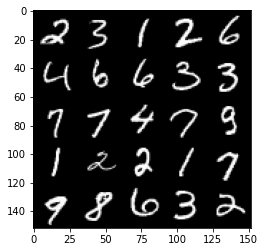

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000 : Generator loss: 3.5860279335975616, Discriminator loss : 0.2677939138710499, cur_batch_size : 128


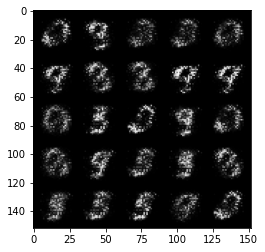

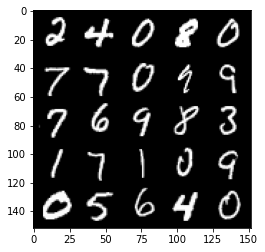

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2500 : Generator loss: 4.747857510566718, Discriminator loss : 0.2493588720858097, cur_batch_size : 128


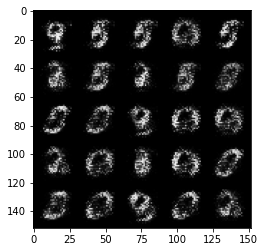

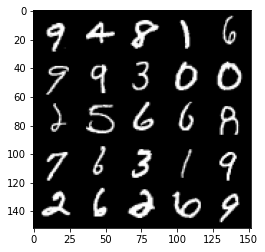

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000 : Generator loss: 6.015325052261366, Discriminator loss : 0.2402414712607859, cur_batch_size : 128


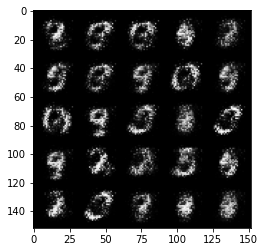

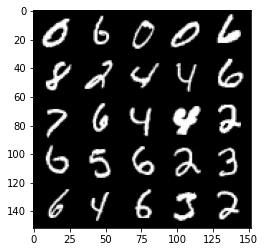

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3500 : Generator loss: 7.5582535853385995, Discriminator loss : 0.18324304980039605, cur_batch_size : 128


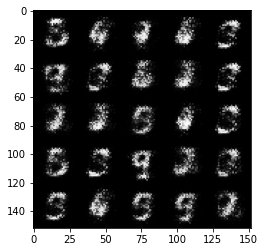

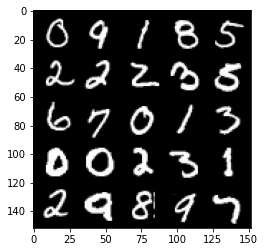

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000 : Generator loss: 9.245594777345662, Discriminator loss : 0.16290355294942846, cur_batch_size : 128


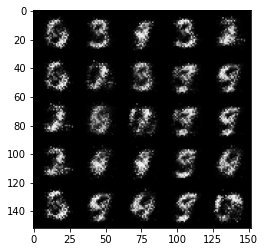

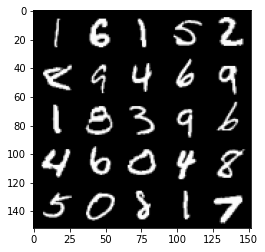

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500 : Generator loss: 11.09887976551057, Discriminator loss : 0.14495179721713075, cur_batch_size : 128


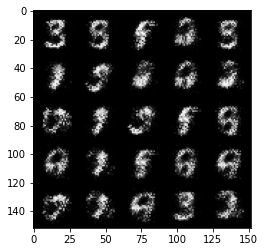

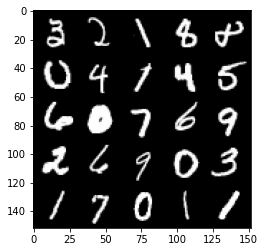

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000 : Generator loss: 12.936815932035458, Discriminator loss : 0.15688028341531762, cur_batch_size : 128


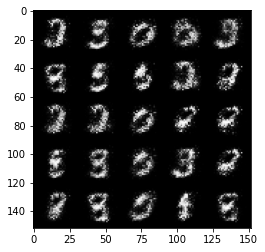

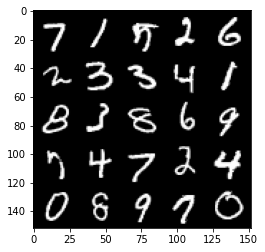

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5500 : Generator loss: 14.884251379013065, Discriminator loss : 0.156938641190529, cur_batch_size : 128


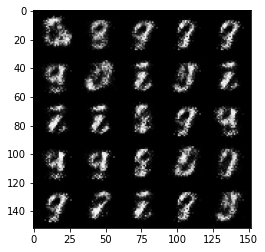

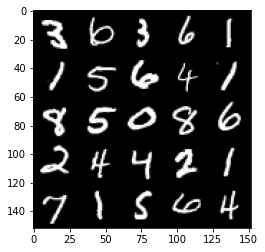

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000 : Generator loss: 16.85747759699821, Discriminator loss : 0.15712721873819824, cur_batch_size : 128


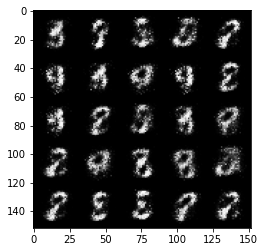

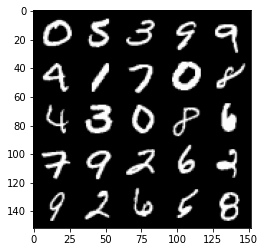

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6500 : Generator loss: 18.8958188033104, Discriminator loss : 0.13815235929191114, cur_batch_size : 128


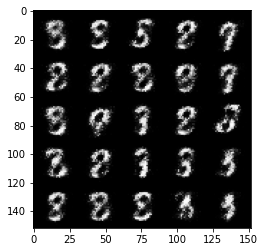

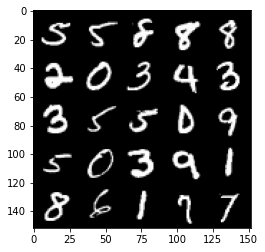

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000 : Generator loss: 20.975278215169872, Discriminator loss : 0.1418163731843234, cur_batch_size : 128


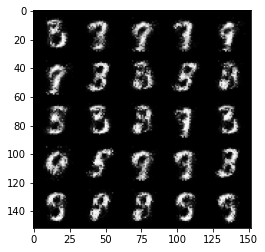

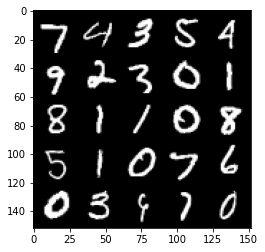

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7500 : Generator loss: 23.11360916948313, Discriminator loss : 0.1474764026850462, cur_batch_size : 128


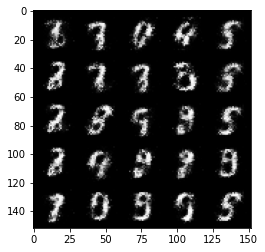

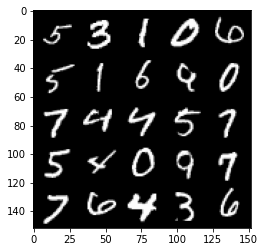

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000 : Generator loss: 25.158397033929784, Discriminator loss : 0.16211733683943744, cur_batch_size : 128


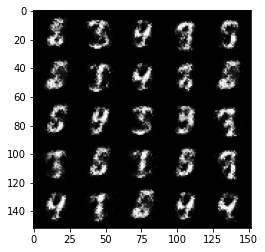

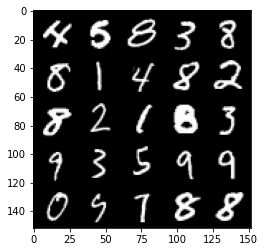

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8500 : Generator loss: 27.239364589691125, Discriminator loss : 0.15042390803992745, cur_batch_size : 128


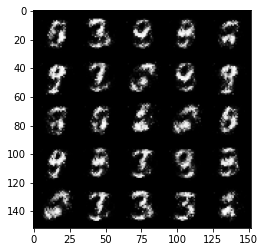

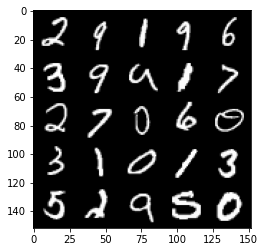

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000 : Generator loss: 29.468739181280117, Discriminator loss : 0.13134118165075784, cur_batch_size : 128


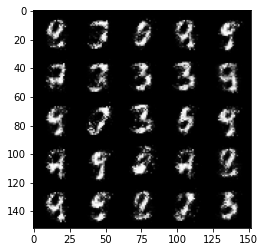

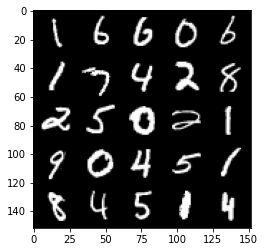

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9500 : Generator loss: 31.890759505510307, Discriminator loss : 0.11255274407565591, cur_batch_size : 128


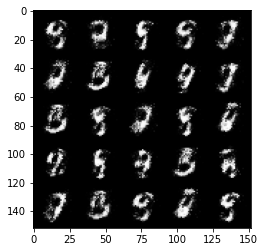

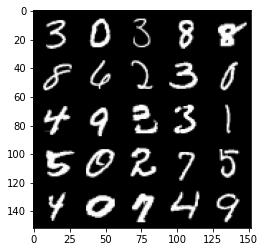

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000 : Generator loss: 34.28105456805224, Discriminator loss : 0.13054482637345785, cur_batch_size : 128


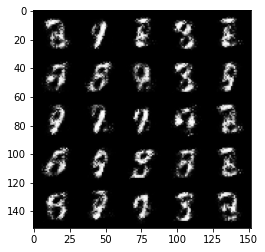

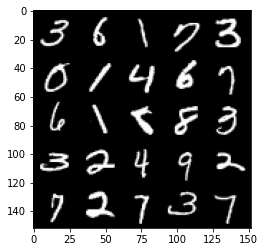

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500 : Generator loss: 36.63264805150027, Discriminator loss : 0.13365691715478897, cur_batch_size : 128


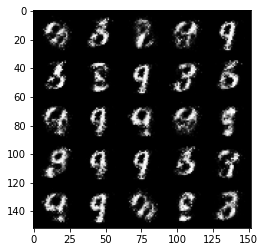

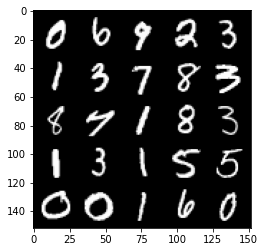

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000 : Generator loss: 38.928712017774565, Discriminator loss : 0.1593879036158323, cur_batch_size : 128


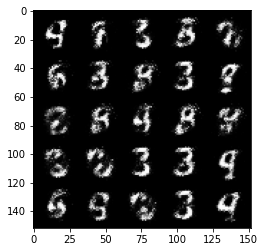

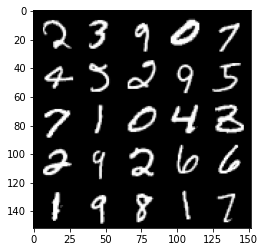

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11500 : Generator loss: 41.35135845589629, Discriminator loss : 0.1413673143982889, cur_batch_size : 128


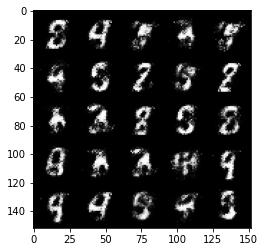

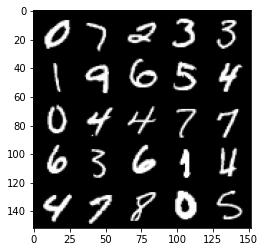

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000 : Generator loss: 43.79211365675922, Discriminator loss : 0.14442830163240436, cur_batch_size : 128


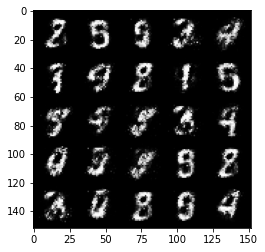

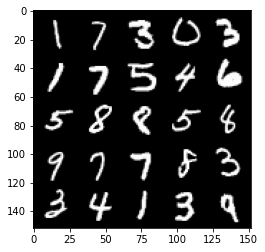

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12500 : Generator loss: 46.16096150827413, Discriminator loss : 0.163312764659524, cur_batch_size : 128


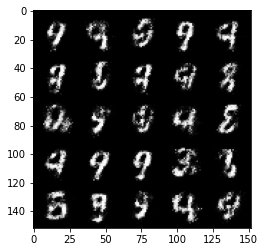

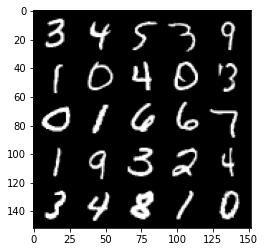

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000 : Generator loss: 48.44978184938437, Discriminator loss : 0.16310420851409438, cur_batch_size : 128


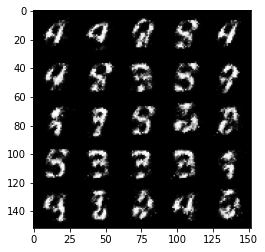

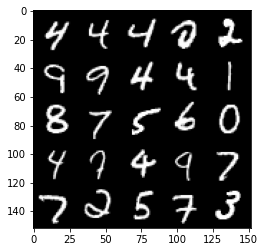

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13500 : Generator loss: 50.73392277860648, Discriminator loss : 0.17463277412950978, cur_batch_size : 128


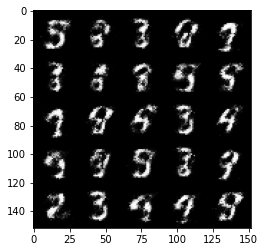

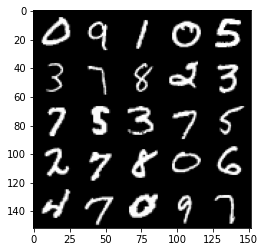

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000 : Generator loss: 52.93851104140288, Discriminator loss : 0.1894051990658044, cur_batch_size : 128


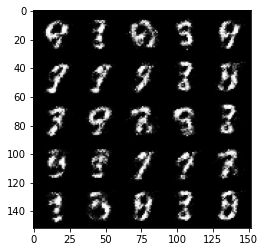

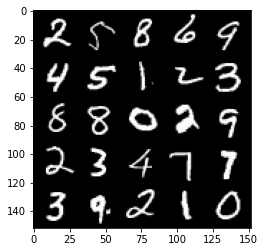

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14500 : Generator loss: 55.21153607749943, Discriminator loss : 0.17098467530310155, cur_batch_size : 128


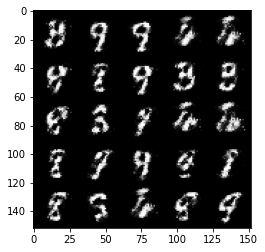

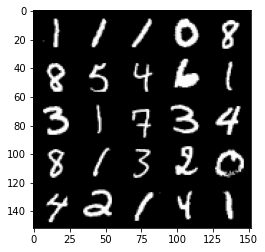

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000 : Generator loss: 57.568677673339835, Discriminator loss : 0.15712619690597063, cur_batch_size : 128


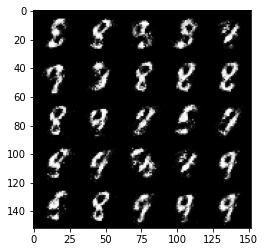

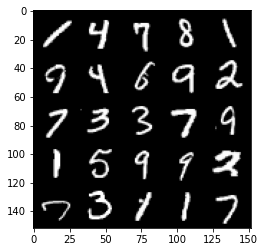

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15500 : Generator loss: 59.96061638736724, Discriminator loss : 0.16851355507969862, cur_batch_size : 128


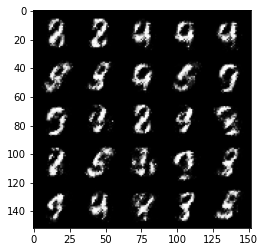

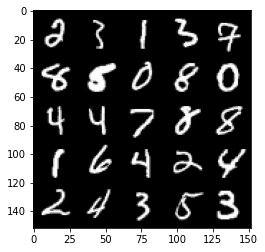

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000 : Generator loss: 62.28694973564147, Discriminator loss : 0.18966072568297374, cur_batch_size : 128


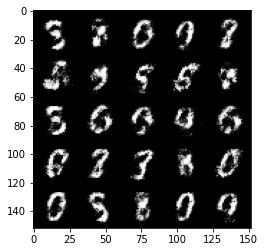

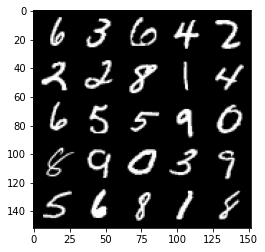

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16500 : Generator loss: 64.60626193261153, Discriminator loss : 0.19955317276716245, cur_batch_size : 128


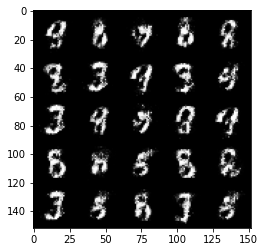

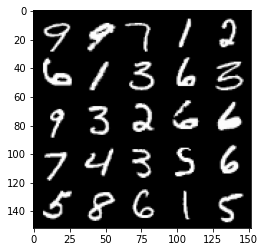

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000 : Generator loss: 66.9187314274311, Discriminator loss : 0.20827169948816288, cur_batch_size : 128


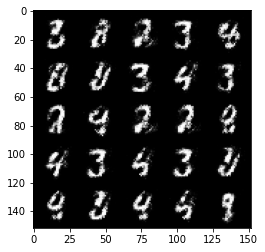

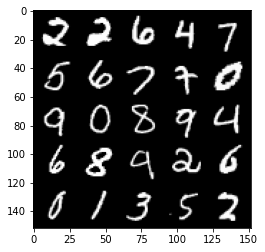

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17500 : Generator loss: 69.21583471179015, Discriminator loss : 0.21326697430014607, cur_batch_size : 128


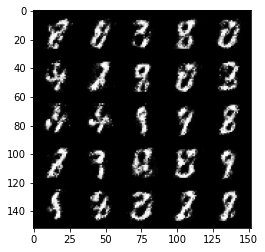

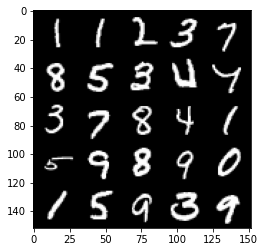

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18000 : Generator loss: 71.46660741543776, Discriminator loss : 0.2075447163283825, cur_batch_size : 128


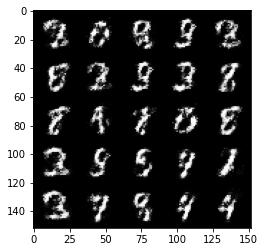

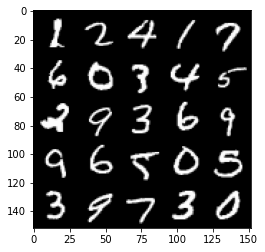

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18500 : Generator loss: 73.65784000611315, Discriminator loss : 0.2200181354284287, cur_batch_size : 128


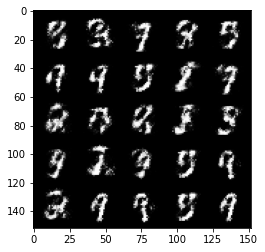

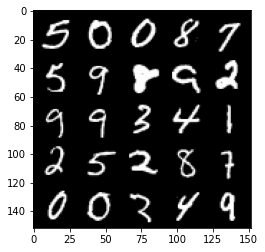

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19000 : Generator loss: 75.93852772212048, Discriminator loss : 0.20143496090173732, cur_batch_size : 128


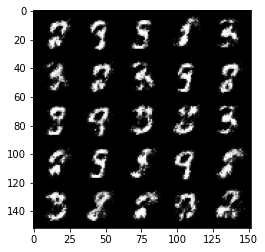

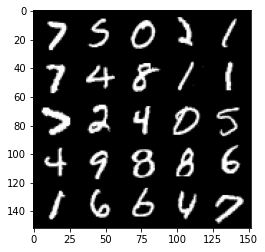

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19500 : Generator loss: 78.1132218966485, Discriminator loss : 0.2235917200744153, cur_batch_size : 128


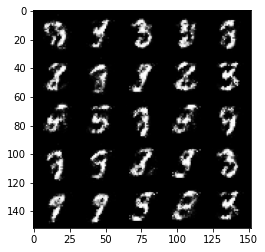

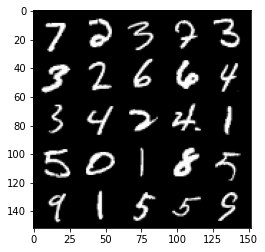

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20000 : Generator loss: 80.31520134019868, Discriminator loss : 0.24507025080919292, cur_batch_size : 128


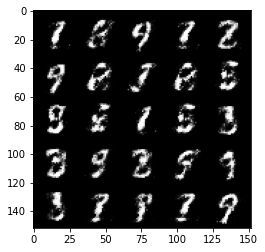

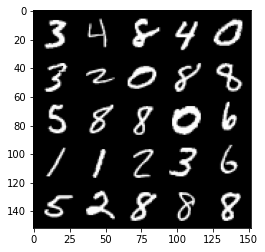

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20500 : Generator loss: 82.4929143877032, Discriminator loss : 0.26415112751722347, cur_batch_size : 128


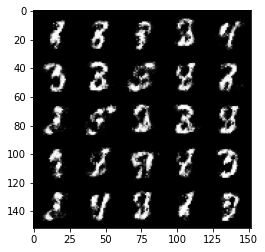

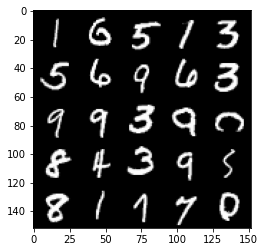

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21000 : Generator loss: 84.53226587295549, Discriminator loss : 0.25133395454287527, cur_batch_size : 128


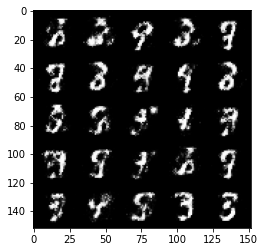

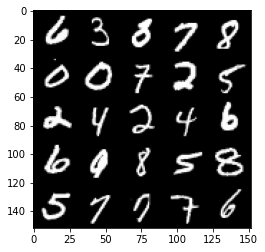

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21500 : Generator loss: 86.64018533206004, Discriminator loss : 0.24582798799872396, cur_batch_size : 128


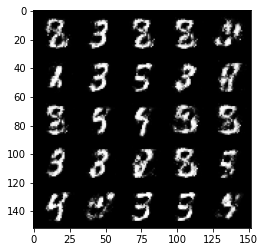

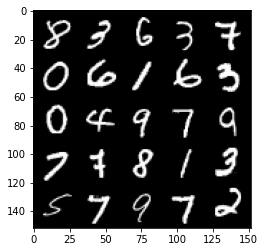

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22000 : Generator loss: 88.74679231929798, Discriminator loss : 0.2771604983210564, cur_batch_size : 128


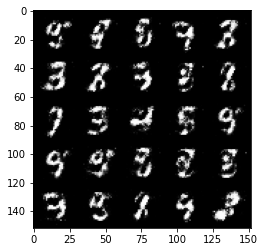

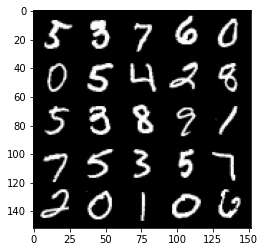

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22500 : Generator loss: 90.79517981791516, Discriminator loss : 0.2713372402191163, cur_batch_size : 128


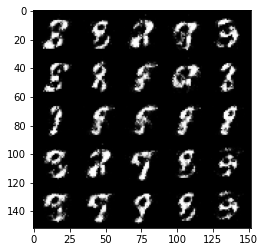

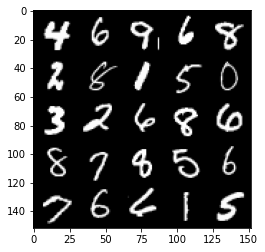

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23000 : Generator loss: 92.80427000451091, Discriminator loss : 0.3096642592549326, cur_batch_size : 128


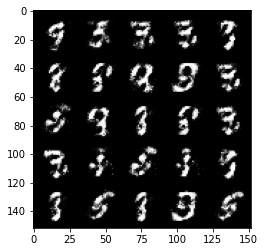

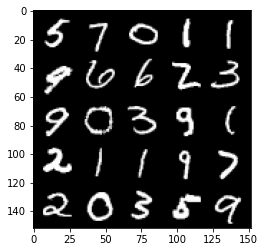

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23500 : Generator loss: 94.76129371762286, Discriminator loss : 0.29144313147664064, cur_batch_size : 128


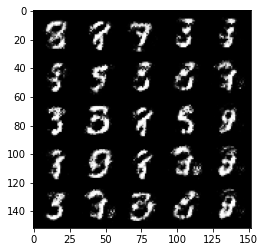

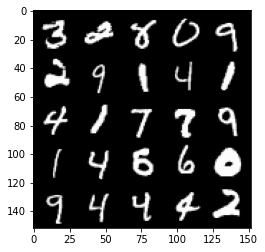

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24000 : Generator loss: 96.77998500871654, Discriminator loss : 0.25792353931069373, cur_batch_size : 128


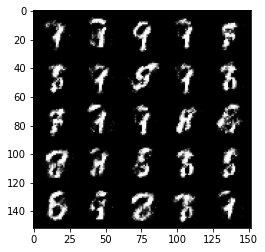

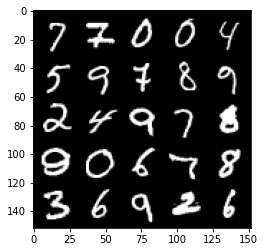

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24500 : Generator loss: 98.75199284982669, Discriminator loss : 0.2809232973158358, cur_batch_size : 128


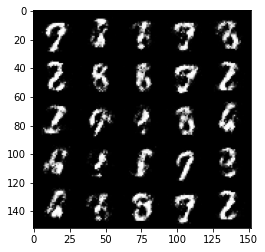

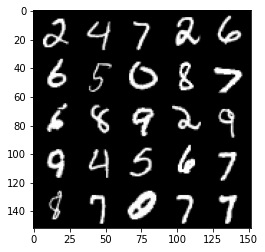

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25000 : Generator loss: 100.58256092000006, Discriminator loss : 0.3040103877782819, cur_batch_size : 128


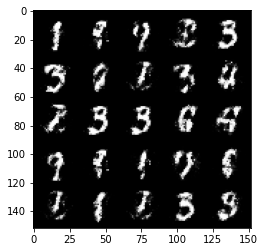

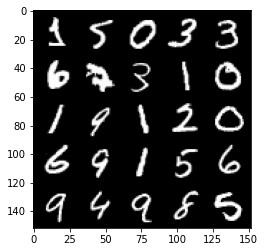

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25500 : Generator loss: 102.50618951392183, Discriminator loss : 0.2958166573643684, cur_batch_size : 128


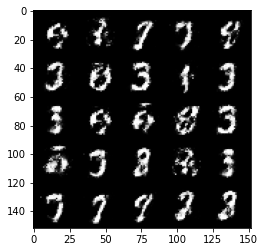

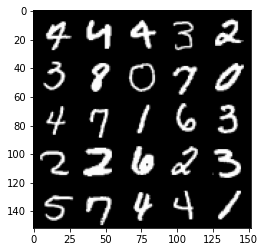

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26000 : Generator loss: 104.40720156908041, Discriminator loss : 0.27492140910029383, cur_batch_size : 128


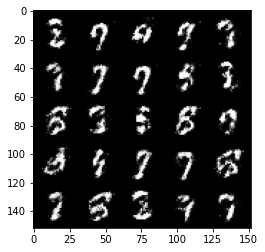

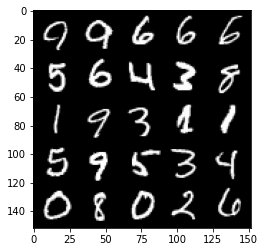

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26500 : Generator loss: 106.38504622316354, Discriminator loss : 0.26566525980830225, cur_batch_size : 128


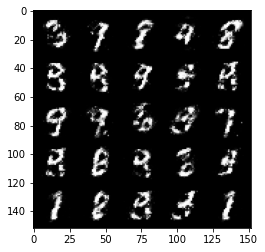

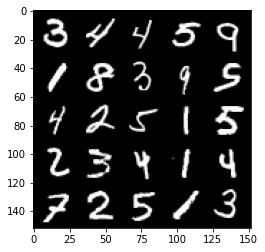

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27000 : Generator loss: 108.3092948534488, Discriminator loss : 0.2951338212788101, cur_batch_size : 128


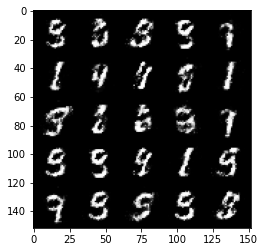

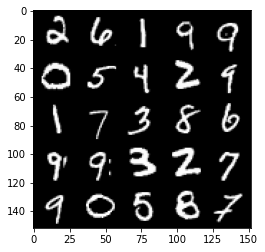

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27500 : Generator loss: 110.13959436726557, Discriminator loss : 0.30018972644209846, cur_batch_size : 128


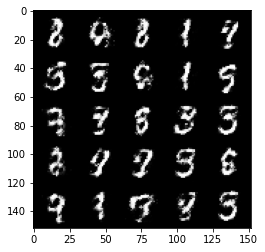

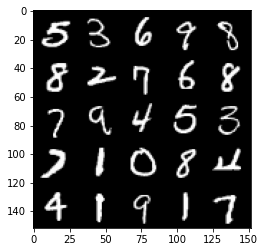

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28000 : Generator loss: 112.00619302821148, Discriminator loss : 0.3057669888734817, cur_batch_size : 128


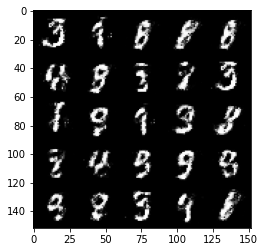

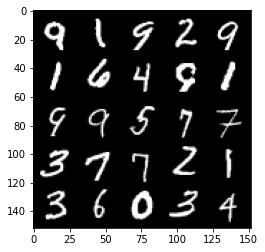

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28500 : Generator loss: 113.84222624254217, Discriminator loss : 0.29147216612100596, cur_batch_size : 128


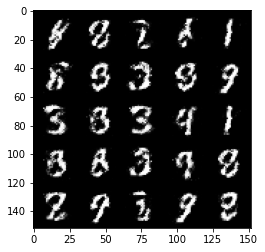

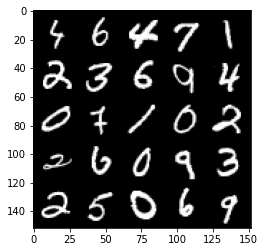

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29000 : Generator loss: 115.65345895910251, Discriminator loss : 0.30532123863697047, cur_batch_size : 128


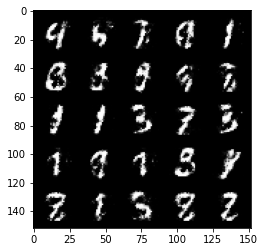

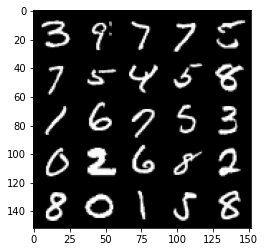

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29500 : Generator loss: 117.50666183304783, Discriminator loss : 0.2912229032814503, cur_batch_size : 128


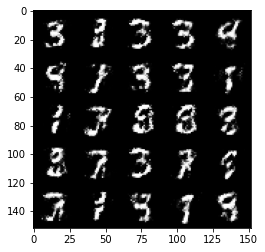

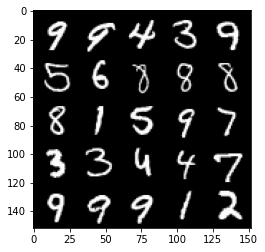

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30000 : Generator loss: 119.41823060083394, Discriminator loss : 0.289969593077898, cur_batch_size : 128


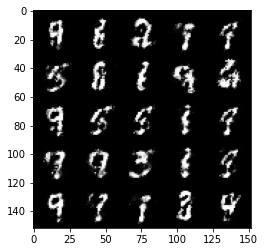

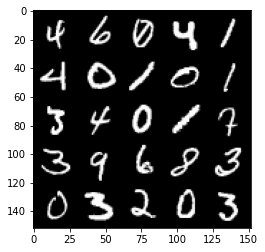

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30500 : Generator loss: 121.23984521174452, Discriminator loss : 0.34717142331600215, cur_batch_size : 128


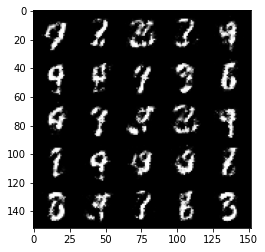

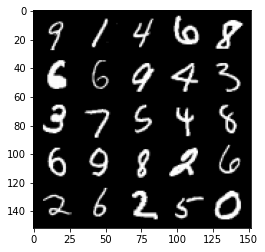

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31000 : Generator loss: 122.97772051286728, Discriminator loss : 0.32649745932221436, cur_batch_size : 128


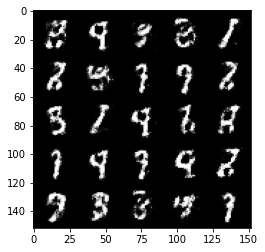

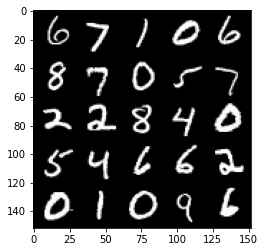

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31500 : Generator loss: 124.67558229923279, Discriminator loss : 0.3736563042402266, cur_batch_size : 128


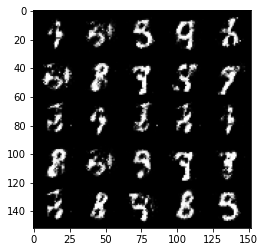

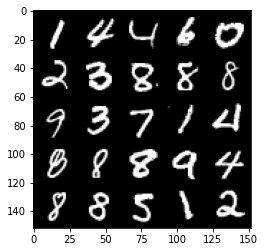

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32000 : Generator loss: 126.34582963275959, Discriminator loss : 0.34044901376962683, cur_batch_size : 128


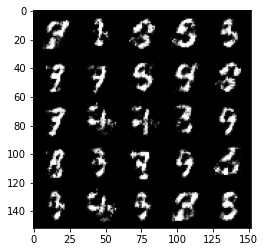

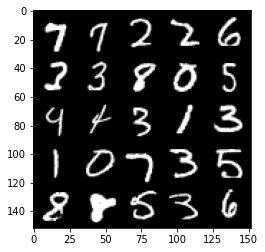

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32500 : Generator loss: 128.07598416018553, Discriminator loss : 0.3512702008783816, cur_batch_size : 128


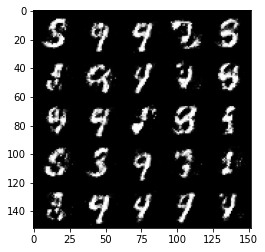

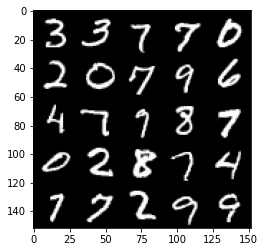

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33000 : Generator loss: 129.6927936954504, Discriminator loss : 0.35493461114168173, cur_batch_size : 128


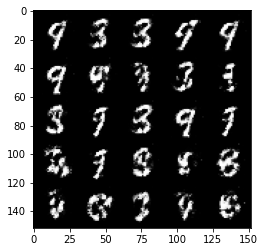

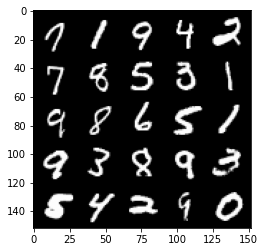

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33500 : Generator loss: 131.3974342837341, Discriminator loss : 0.32155520683526984, cur_batch_size : 128


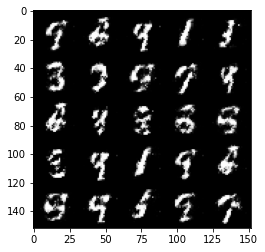

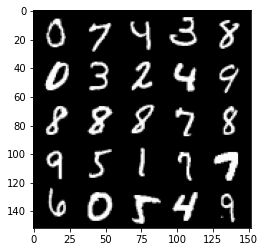

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34000 : Generator loss: 133.11984659814897, Discriminator loss : 0.33899722951650607, cur_batch_size : 128


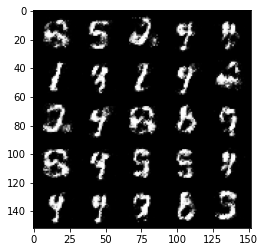

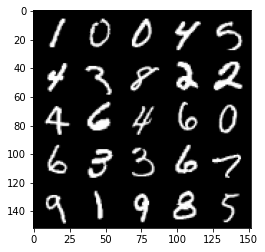

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34500 : Generator loss: 134.79940823888862, Discriminator loss : 0.34965210467576957, cur_batch_size : 128


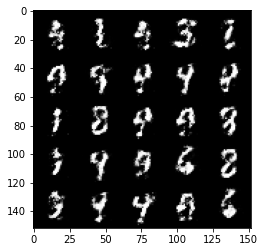

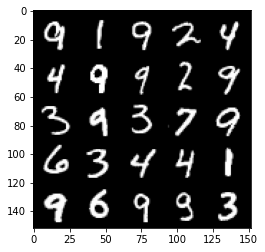

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35000 : Generator loss: 136.4005290913589, Discriminator loss : 0.36825473195314434, cur_batch_size : 128


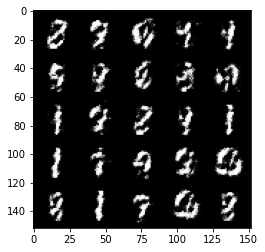

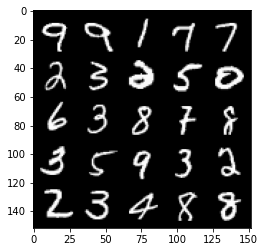

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35500 : Generator loss: 138.01994706821523, Discriminator loss : 0.3866105539798735, cur_batch_size : 128


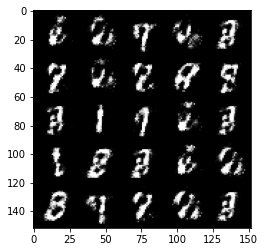

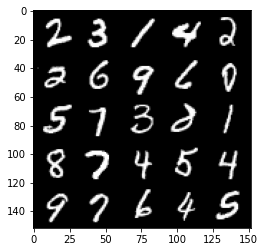

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36000 : Generator loss: 139.54022415494998, Discriminator loss : 0.36679857796430587, cur_batch_size : 128


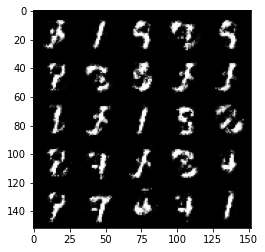

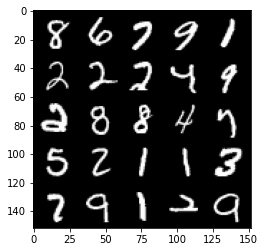

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36500 : Generator loss: 141.1770559778219, Discriminator loss : 0.34086999139189716, cur_batch_size : 128


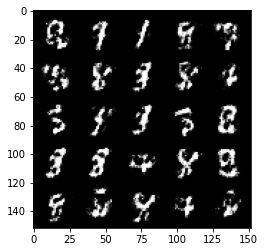

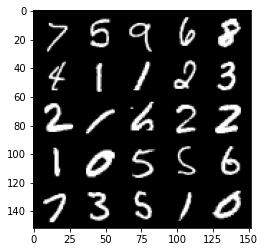

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37000 : Generator loss: 142.7723199114803, Discriminator loss : 0.3767711182236672, cur_batch_size : 128


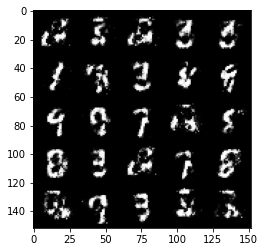

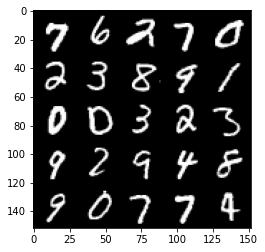

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37500 : Generator loss: 144.38569839954408, Discriminator loss : 0.3617403402924541, cur_batch_size : 128


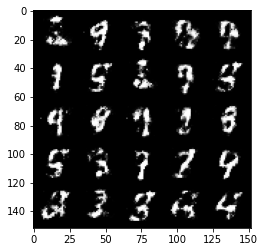

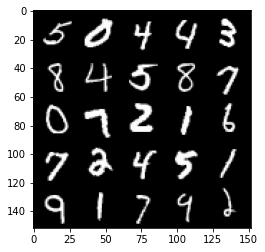

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38000 : Generator loss: 145.95322676563273, Discriminator loss : 0.3692515391111375, cur_batch_size : 128


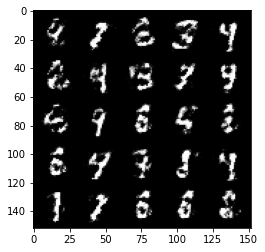

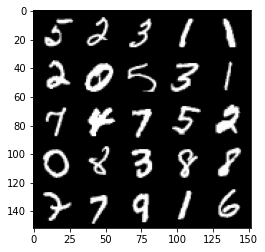

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38500 : Generator loss: 147.58487065100692, Discriminator loss : 0.3571338865458963, cur_batch_size : 128


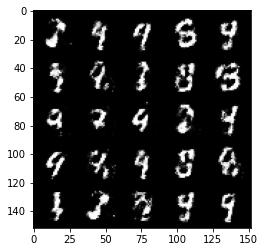

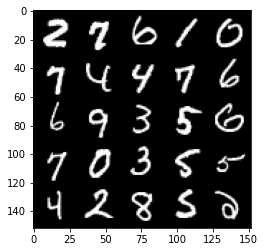

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39000 : Generator loss: 149.07365841627137, Discriminator loss : 0.4211865511536599, cur_batch_size : 128


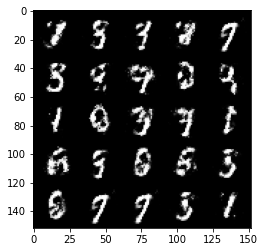

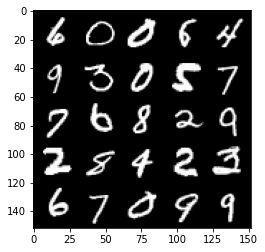

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39500 : Generator loss: 150.53530428886447, Discriminator loss : 0.4018061991930007, cur_batch_size : 128


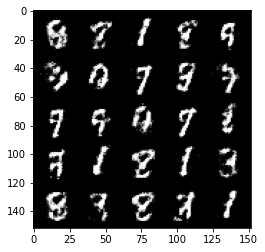

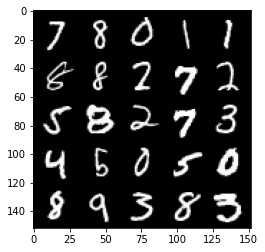

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40000 : Generator loss: 152.0299945456987, Discriminator loss : 0.40180906957387913, cur_batch_size : 128


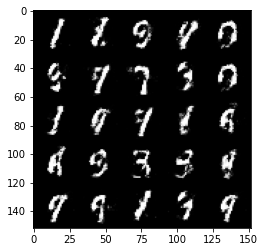

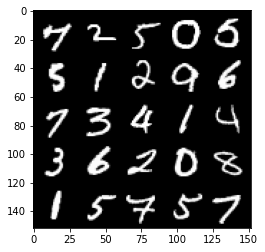

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40500 : Generator loss: 153.44321687197737, Discriminator loss : 0.4218071543574332, cur_batch_size : 128


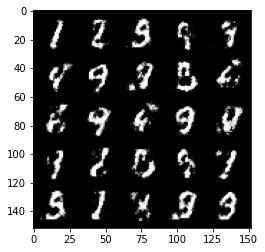

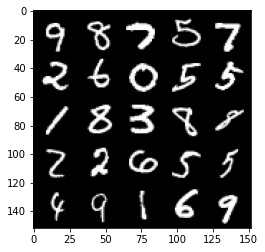

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41000 : Generator loss: 154.94420200991675, Discriminator loss : 0.38672259026765804, cur_batch_size : 128


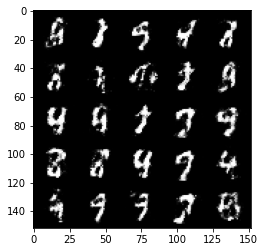

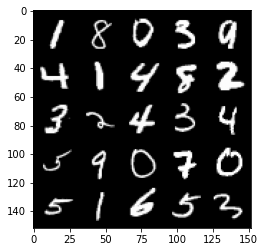

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41500 : Generator loss: 156.38591590571488, Discriminator loss : 0.4115151114463809, cur_batch_size : 128


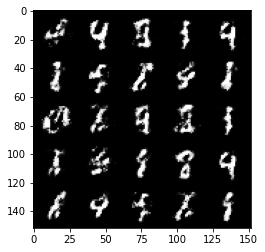

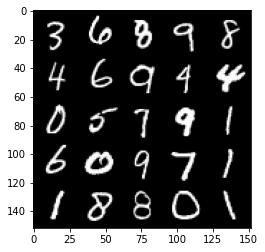

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42000 : Generator loss: 157.815919270278, Discriminator loss : 0.4121126320958136, cur_batch_size : 128


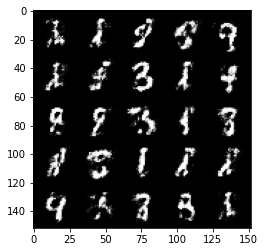

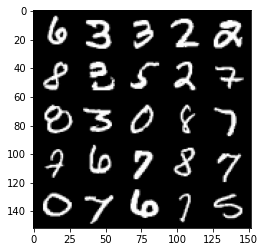

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42500 : Generator loss: 159.24463621854898, Discriminator loss : 0.42288806349039054, cur_batch_size : 128


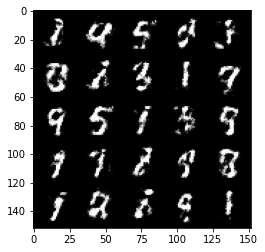

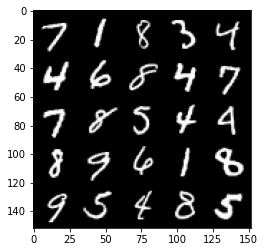

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43000 : Generator loss: 160.65262650847512, Discriminator loss : 0.39797540670633347, cur_batch_size : 128


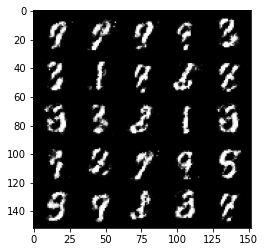

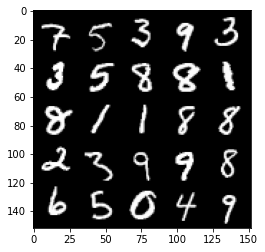

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43500 : Generator loss: 162.0704369862085, Discriminator loss : 0.42769413107633575, cur_batch_size : 128


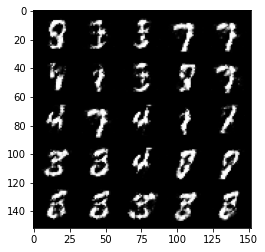

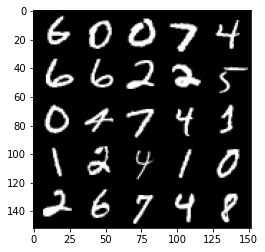

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44000 : Generator loss: 163.47184309363413, Discriminator loss : 0.4292814258933067, cur_batch_size : 128


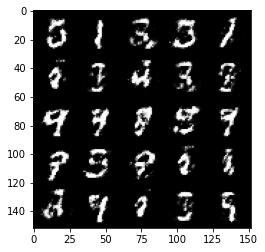

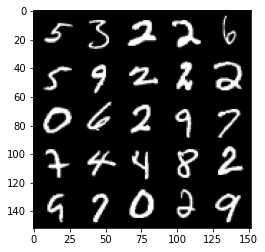

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44500 : Generator loss: 164.85783016538647, Discriminator loss : 0.43108387422561634, cur_batch_size : 128


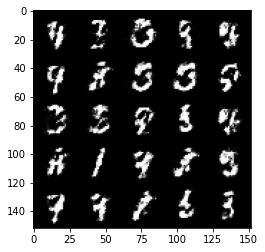

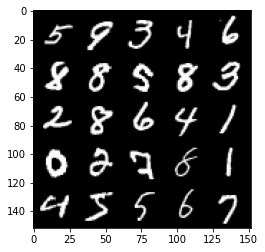

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45000 : Generator loss: 166.2532057180408, Discriminator loss : 0.42692437601089483, cur_batch_size : 128


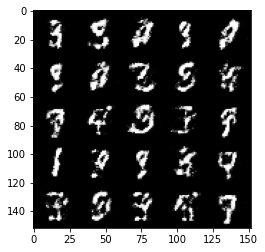

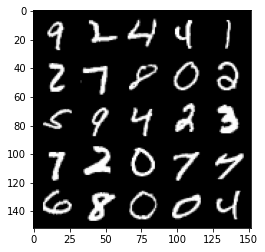

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45500 : Generator loss: 167.68006404209183, Discriminator loss : 0.4154724807739258, cur_batch_size : 128


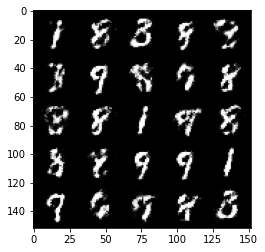

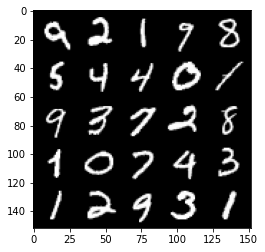

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46000 : Generator loss: 169.04345701909108, Discriminator loss : 0.43880030745267834, cur_batch_size : 128


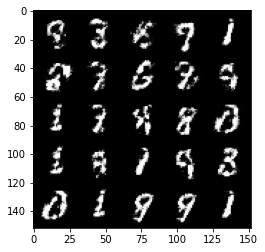

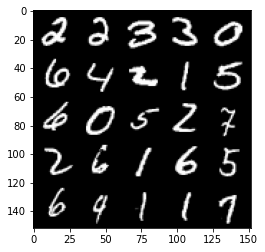

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46500 : Generator loss: 170.4900707132817, Discriminator loss : 0.4001338412761687, cur_batch_size : 128


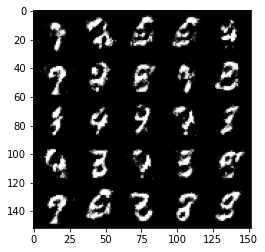

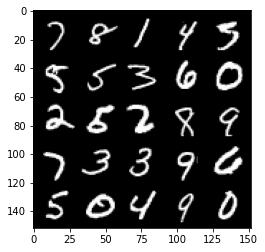

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47000 : Generator loss: 171.8321816048621, Discriminator loss : 0.43632712471485136, cur_batch_size : 128


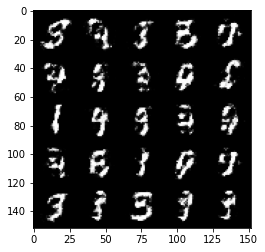

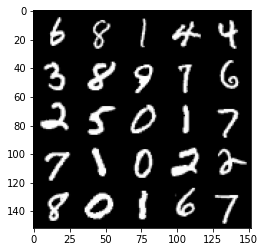

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47500 : Generator loss: 173.19250961708983, Discriminator loss : 0.43346773123741233, cur_batch_size : 128


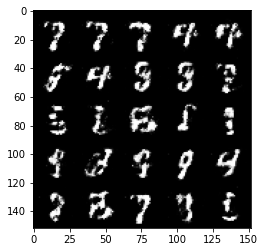

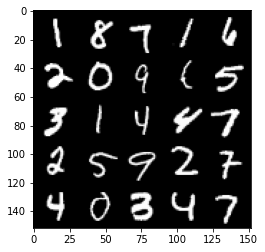

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48000 : Generator loss: 174.5270937445159, Discriminator loss : 0.4265502305030822, cur_batch_size : 128


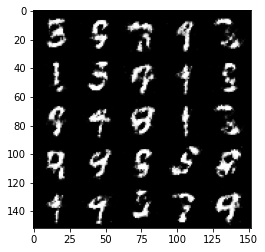

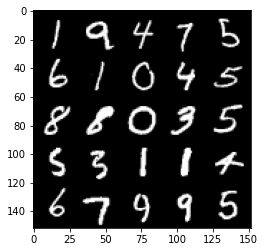

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48500 : Generator loss: 175.91836863350818, Discriminator loss : 0.3981932044029237, cur_batch_size : 128


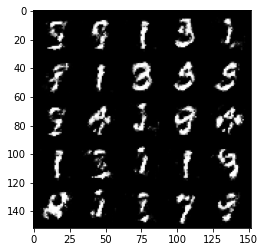

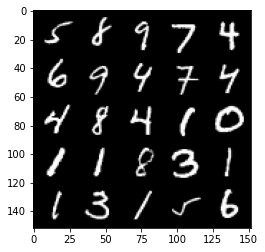

  0%|          | 0/469 [00:00<?, ?it/s]

Step 49000 : Generator loss: 177.2641817209714, Discriminator loss : 0.441704198002815, cur_batch_size : 128


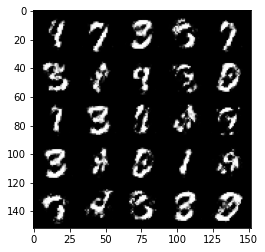

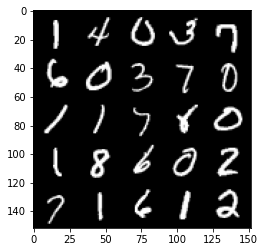

  0%|          | 0/469 [00:00<?, ?it/s]

Step 49500 : Generator loss: 178.58635399103076, Discriminator loss : 0.4232387714385988, cur_batch_size : 128


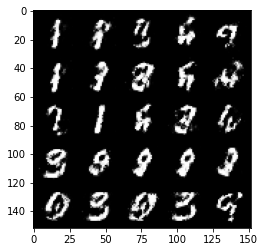

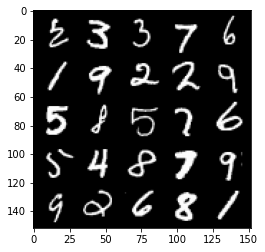

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50000 : Generator loss: 179.92482191681773, Discriminator loss : 0.4628741856217379, cur_batch_size : 128


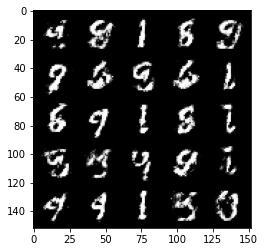

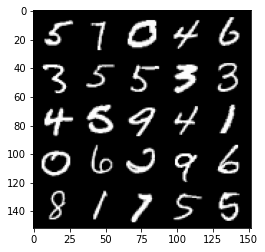

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50500 : Generator loss: 181.2085056884281, Discriminator loss : 0.46370679444074664, cur_batch_size : 128


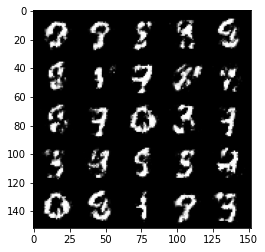

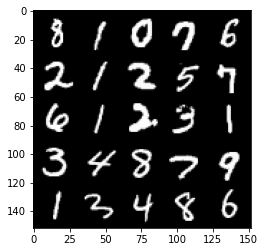

  0%|          | 0/469 [00:00<?, ?it/s]

Step 51000 : Generator loss: 182.3836541049471, Discriminator loss : 0.5094076997041703, cur_batch_size : 128


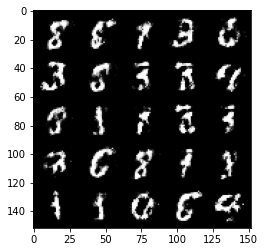

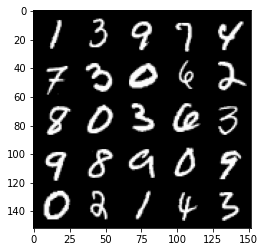

  0%|          | 0/469 [00:00<?, ?it/s]

Step 51500 : Generator loss: 183.54483455562507, Discriminator loss : 0.4534169560670851, cur_batch_size : 128


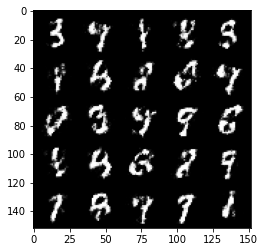

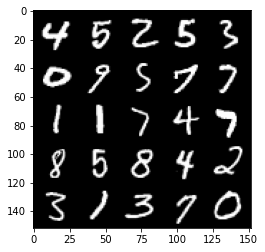

  0%|          | 0/469 [00:00<?, ?it/s]

Step 52000 : Generator loss: 184.76070212626405, Discriminator loss : 0.4687487242817881, cur_batch_size : 128


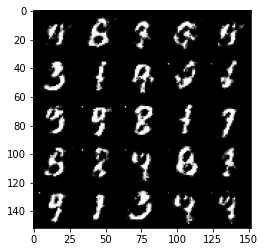

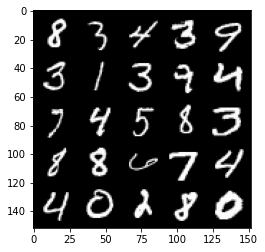

  0%|          | 0/469 [00:00<?, ?it/s]

Step 52500 : Generator loss: 186.0322540214055, Discriminator loss : 0.44232804870605485, cur_batch_size : 128


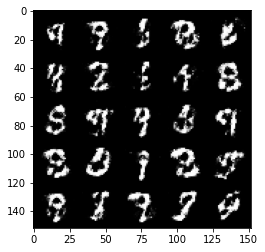

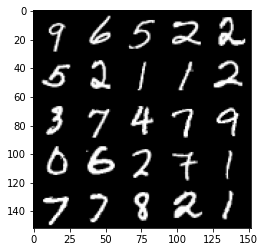

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 53000 : Generator loss: 187.2504410400381, Discriminator loss : 0.48644271361827834, cur_batch_size : 128


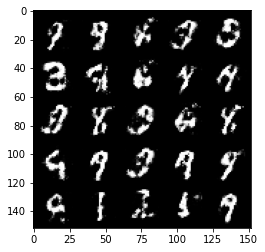

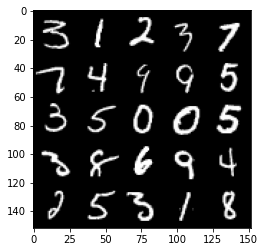

  0%|          | 0/469 [00:00<?, ?it/s]

Step 53500 : Generator loss: 188.49255535840896, Discriminator loss : 0.46187903499603294, cur_batch_size : 128


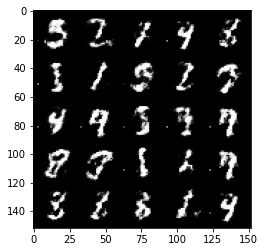

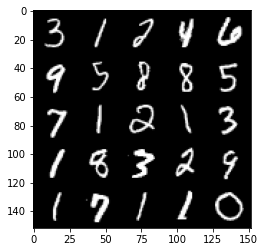

  0%|          | 0/469 [00:00<?, ?it/s]

Step 54000 : Generator loss: 189.6883829569807, Discriminator loss : 0.4631143867969513, cur_batch_size : 128


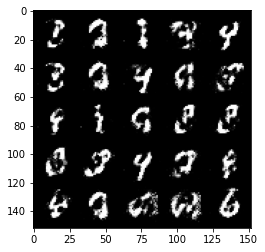

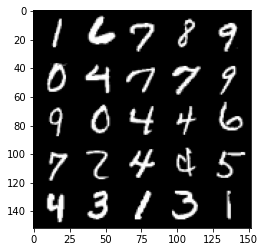

  0%|          | 0/469 [00:00<?, ?it/s]

Step 54500 : Generator loss: 190.94812104463477, Discriminator loss : 0.45956111383438114, cur_batch_size : 128


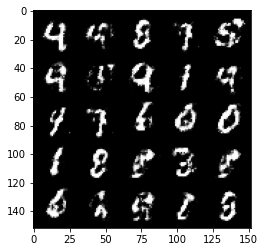

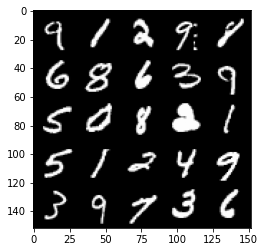

  0%|          | 0/469 [00:00<?, ?it/s]

Step 55000 : Generator loss: 192.12388763499234, Discriminator loss : 0.508930913209915, cur_batch_size : 128


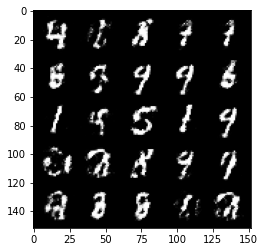

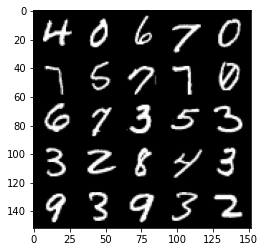

  0%|          | 0/469 [00:00<?, ?it/s]

Step 55500 : Generator loss: 193.28668124198876, Discriminator loss : 0.5096660199165343, cur_batch_size : 128


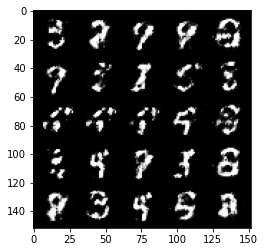

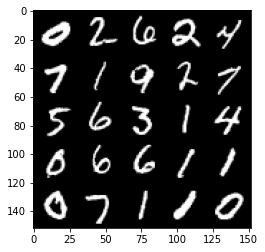

  0%|          | 0/469 [00:00<?, ?it/s]

Step 56000 : Generator loss: 194.4125947346684, Discriminator loss : 0.48095770865678755, cur_batch_size : 128


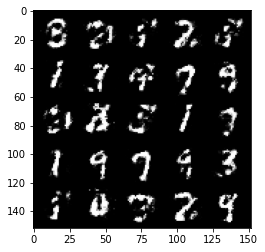

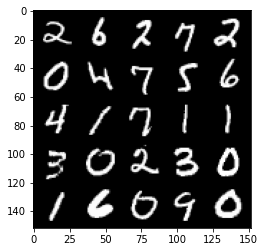

  0%|          | 0/469 [00:00<?, ?it/s]

Step 56500 : Generator loss: 195.62628637337644, Discriminator loss : 0.46653242075443285, cur_batch_size : 128


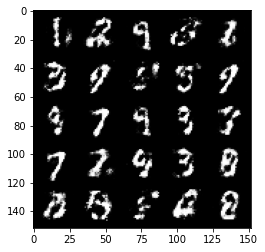

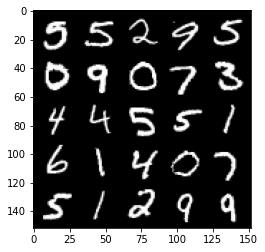

  0%|          | 0/469 [00:00<?, ?it/s]

Step 57000 : Generator loss: 196.79889510738823, Discriminator loss : 0.5078793946504592, cur_batch_size : 128


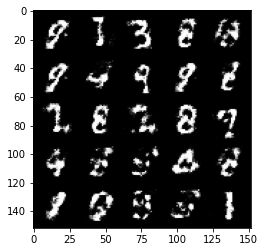

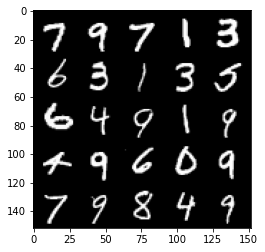

  0%|          | 0/469 [00:00<?, ?it/s]

Step 57500 : Generator loss: 197.89957039260844, Discriminator loss : 0.5019811457991598, cur_batch_size : 128


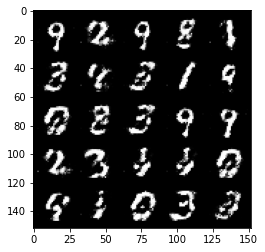

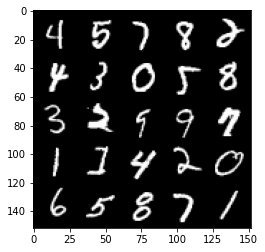

  0%|          | 0/469 [00:00<?, ?it/s]

Step 58000 : Generator loss: 199.07241942501057, Discriminator loss : 0.4802525145411489, cur_batch_size : 128


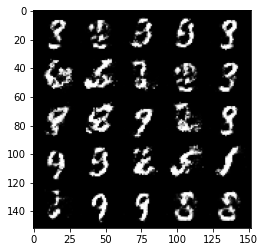

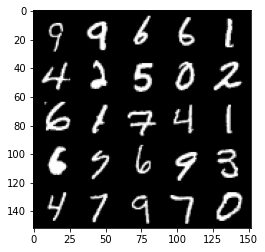

  0%|          | 0/469 [00:00<?, ?it/s]

Step 58500 : Generator loss: 200.1950669103864, Discriminator loss : 0.5315978604555132, cur_batch_size : 128


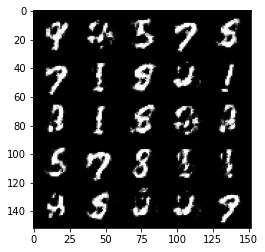

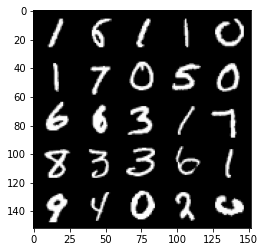

  0%|          | 0/469 [00:00<?, ?it/s]

Step 59000 : Generator loss: 201.3054776185753, Discriminator loss : 0.4960755023360254, cur_batch_size : 128


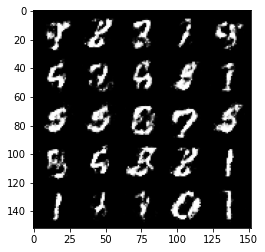

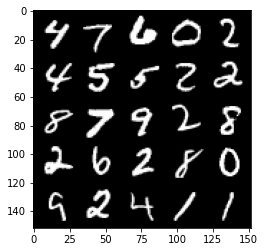

  0%|          | 0/469 [00:00<?, ?it/s]

Step 59500 : Generator loss: 202.43482232725654, Discriminator loss : 0.49320338600873925, cur_batch_size : 128


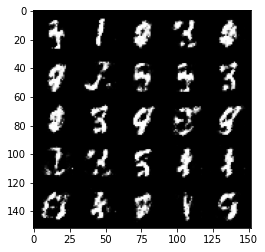

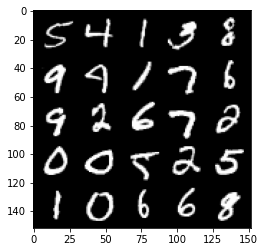

  0%|          | 0/469 [00:00<?, ?it/s]

Step 60000 : Generator loss: 203.56805318939743, Discriminator loss : 0.5107569117546087, cur_batch_size : 128


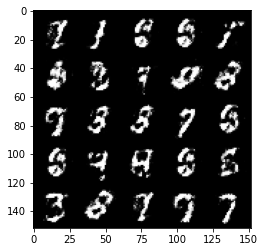

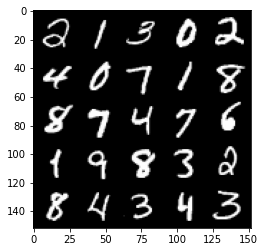

  0%|          | 0/469 [00:00<?, ?it/s]

Step 60500 : Generator loss: 204.66170853626784, Discriminator loss : 0.5203141795396804, cur_batch_size : 96


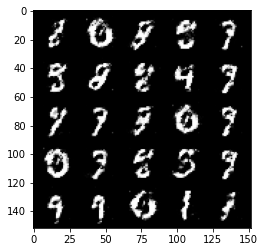

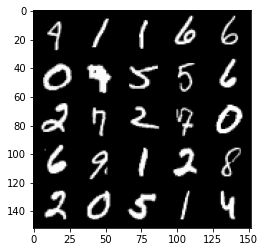

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 61000 : Generator loss: 205.78408801114634, Discriminator loss : 0.49608823275566116, cur_batch_size : 128


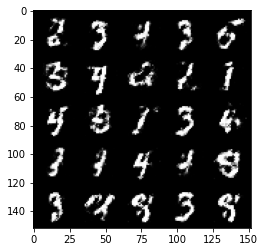

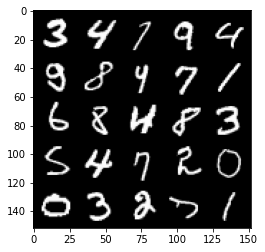

  0%|          | 0/469 [00:00<?, ?it/s]

Step 61500 : Generator loss: 206.9188971725709, Discriminator loss : 0.505540709972382, cur_batch_size : 128


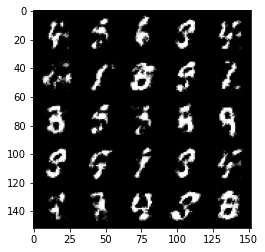

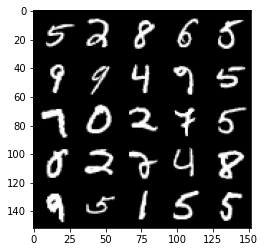

  0%|          | 0/469 [00:00<?, ?it/s]

Step 62000 : Generator loss: 208.0293598700766, Discriminator loss : 0.4756120136380195, cur_batch_size : 128


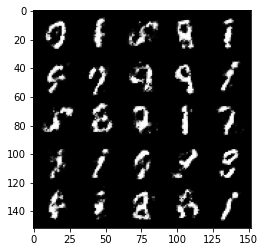

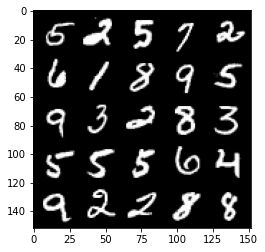

  0%|          | 0/469 [00:00<?, ?it/s]

Step 62500 : Generator loss: 209.17198009431388, Discriminator loss : 0.499385001540184, cur_batch_size : 128


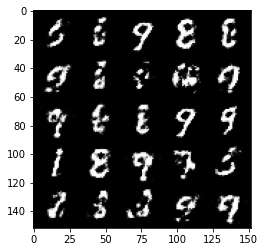

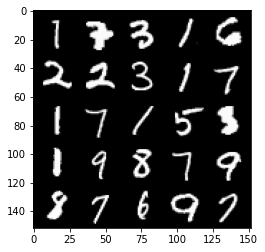

  0%|          | 0/469 [00:00<?, ?it/s]

Step 63000 : Generator loss: 210.32127173435728, Discriminator loss : 0.5126055874824524, cur_batch_size : 128


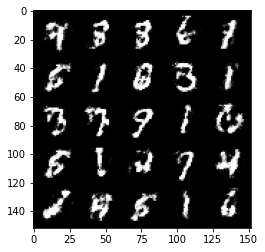

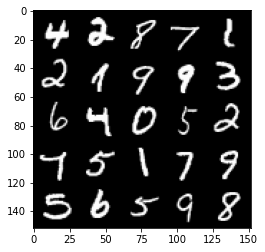

  0%|          | 0/469 [00:00<?, ?it/s]

Step 63500 : Generator loss: 211.43098635053664, Discriminator loss : 0.5330284447073934, cur_batch_size : 128


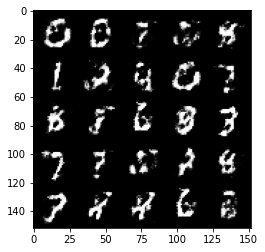

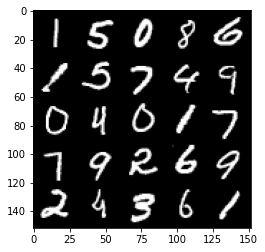

  0%|          | 0/469 [00:00<?, ?it/s]

Step 64000 : Generator loss: 212.5186126186848, Discriminator loss : 0.4879308145046236, cur_batch_size : 128


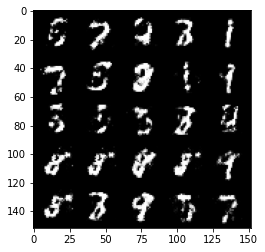

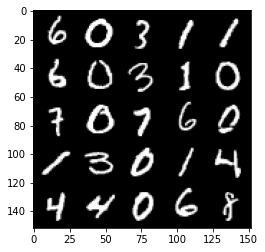

  0%|          | 0/469 [00:00<?, ?it/s]

Step 64500 : Generator loss: 213.61424549937232, Discriminator loss : 0.5158194988965986, cur_batch_size : 128


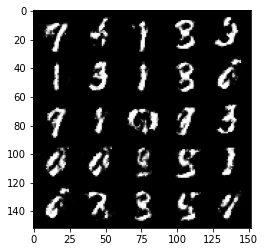

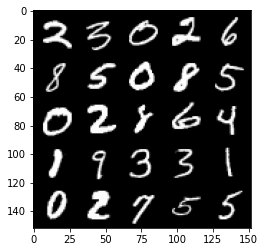

  0%|          | 0/469 [00:00<?, ?it/s]

Step 65000 : Generator loss: 214.67986687624443, Discriminator loss : 0.5354604138731957, cur_batch_size : 128


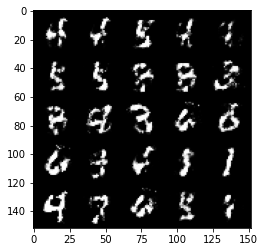

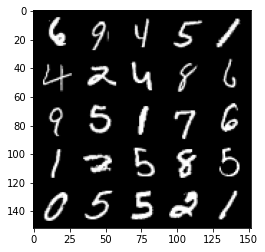

  0%|          | 0/469 [00:00<?, ?it/s]

Step 65500 : Generator loss: 215.71888950443235, Discriminator loss : 0.5279282093048094, cur_batch_size : 128


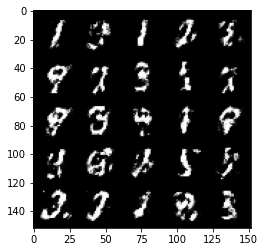

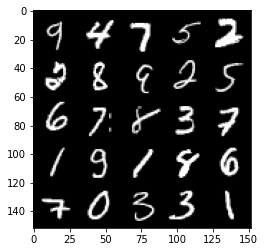

  0%|          | 0/469 [00:00<?, ?it/s]

Step 66000 : Generator loss: 216.78664042627778, Discriminator loss : 0.5236913858652117, cur_batch_size : 128


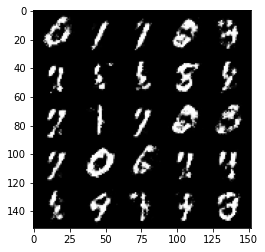

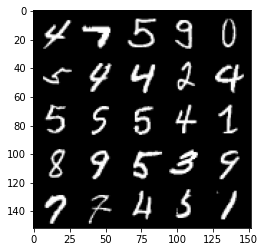

  0%|          | 0/469 [00:00<?, ?it/s]

Step 66500 : Generator loss: 217.85518849754294, Discriminator loss : 0.5363090885281565, cur_batch_size : 128


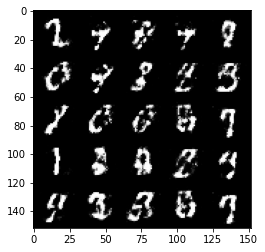

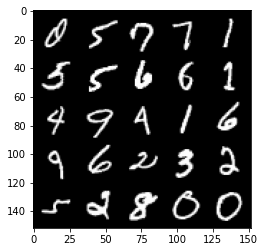

  0%|          | 0/469 [00:00<?, ?it/s]

Step 67000 : Generator loss: 218.89753557181334, Discriminator loss : 0.5156765484213828, cur_batch_size : 128


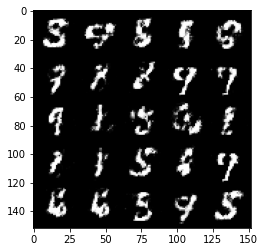

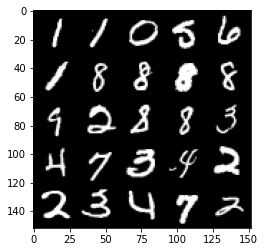

  0%|          | 0/469 [00:00<?, ?it/s]

Step 67500 : Generator loss: 219.95961481702287, Discriminator loss : 0.5265928392410282, cur_batch_size : 128


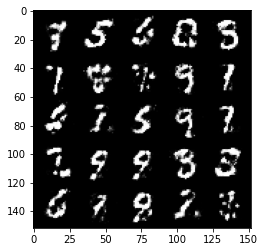

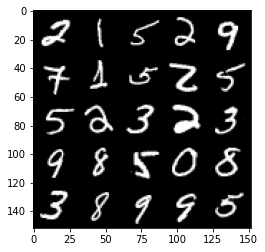

  0%|          | 0/469 [00:00<?, ?it/s]

Step 68000 : Generator loss: 221.01859947502555, Discriminator loss : 0.5260668728947637, cur_batch_size : 128


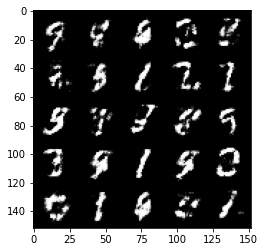

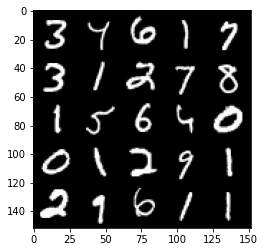

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 68500 : Generator loss: 222.07067239499028, Discriminator loss : 0.5319663633108139, cur_batch_size : 128


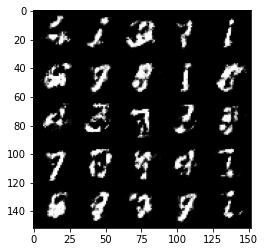

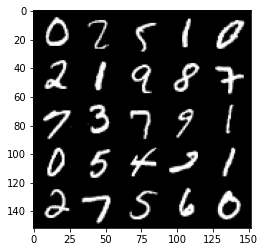

  0%|          | 0/469 [00:00<?, ?it/s]

Step 69000 : Generator loss: 223.0964404970399, Discriminator loss : 0.5481202241778375, cur_batch_size : 128


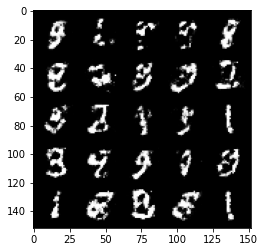

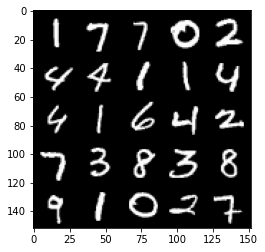

  0%|          | 0/469 [00:00<?, ?it/s]

Step 69500 : Generator loss: 224.10685653078454, Discriminator loss : 0.5538550965785987, cur_batch_size : 128


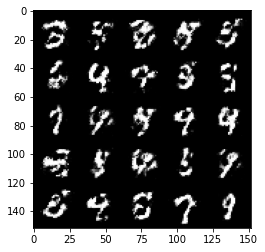

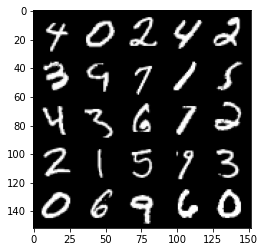

  0%|          | 0/469 [00:00<?, ?it/s]

Step 70000 : Generator loss: 225.12295538222673, Discriminator loss : 0.5355545908808704, cur_batch_size : 128


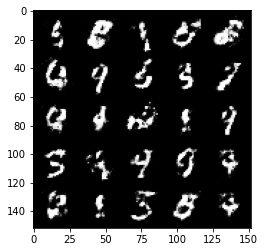

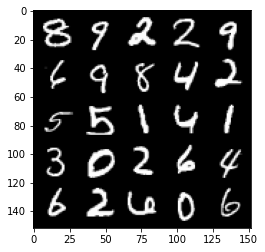

  0%|          | 0/469 [00:00<?, ?it/s]

Step 70500 : Generator loss: 226.12621290886295, Discriminator loss : 0.5541880955100061, cur_batch_size : 128


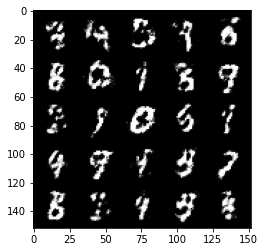

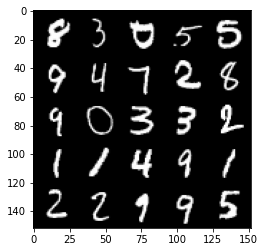

  0%|          | 0/469 [00:00<?, ?it/s]

Step 71000 : Generator loss: 227.13491552364707, Discriminator loss : 0.541991617083549, cur_batch_size : 128


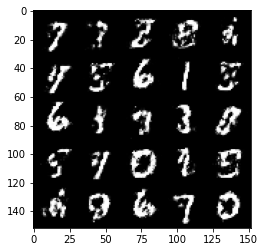

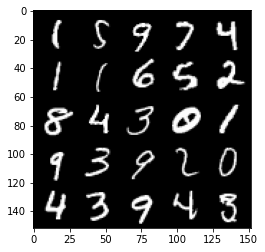

  0%|          | 0/469 [00:00<?, ?it/s]

Step 71500 : Generator loss: 228.14123229288933, Discriminator loss : 0.5608898589611057, cur_batch_size : 128


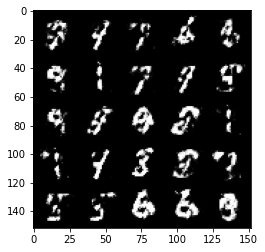

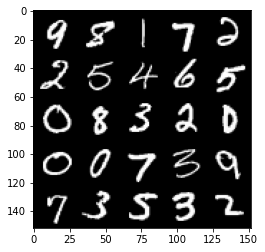

  0%|          | 0/469 [00:00<?, ?it/s]

Step 72000 : Generator loss: 229.12425245594864, Discriminator loss : 0.5667684246301653, cur_batch_size : 128


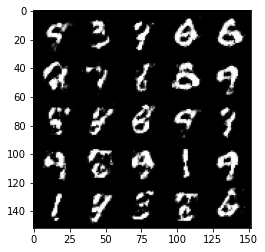

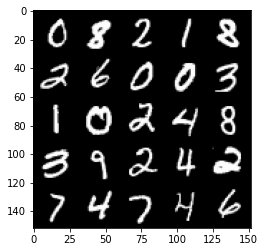

  0%|          | 0/469 [00:00<?, ?it/s]

Step 72500 : Generator loss: 230.07765010797877, Discriminator loss : 0.5475749160051346, cur_batch_size : 128


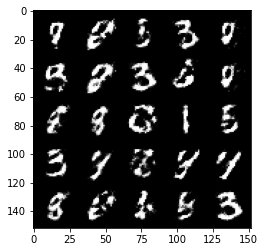

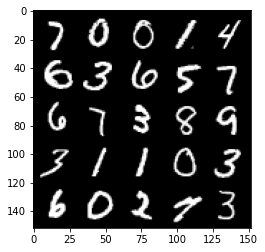

  0%|          | 0/469 [00:00<?, ?it/s]

Step 73000 : Generator loss: 231.0576758311978, Discriminator loss : 0.5771300131678584, cur_batch_size : 128


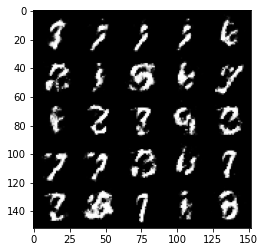

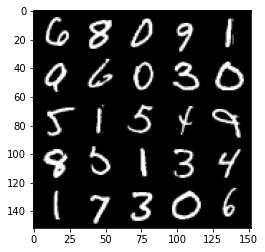

  0%|          | 0/469 [00:00<?, ?it/s]

Step 73500 : Generator loss: 232.00007753872808, Discriminator loss : 0.5461246659159661, cur_batch_size : 128


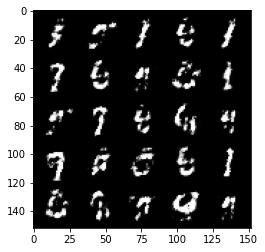

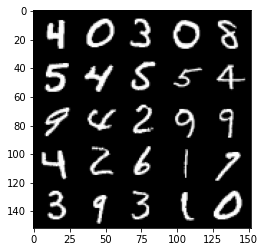

  0%|          | 0/469 [00:00<?, ?it/s]

Step 74000 : Generator loss: 232.96637491655267, Discriminator loss : 0.5662682774066923, cur_batch_size : 128


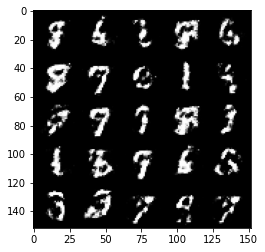

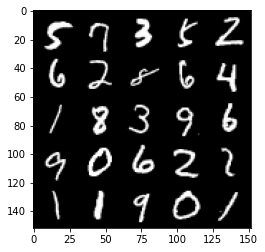

  0%|          | 0/469 [00:00<?, ?it/s]

Step 74500 : Generator loss: 233.92066190266502, Discriminator loss : 0.5560023958086966, cur_batch_size : 128


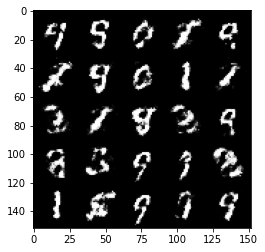

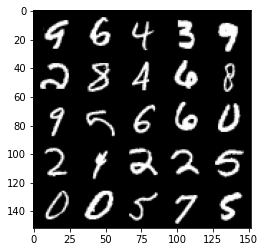

  0%|          | 0/469 [00:00<?, ?it/s]

Step 75000 : Generator loss: 234.8877918316117, Discriminator loss : 0.5481126703023914, cur_batch_size : 128


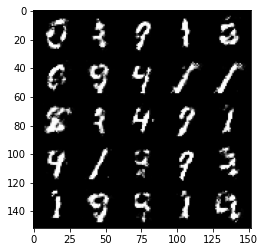

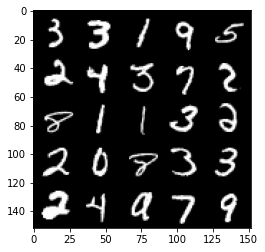

  0%|          | 0/469 [00:00<?, ?it/s]

Step 75500 : Generator loss: 235.85389762365742, Discriminator loss : 0.543698056221008, cur_batch_size : 128


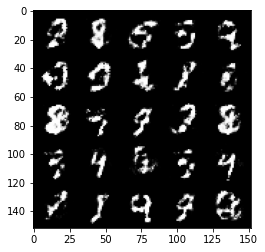

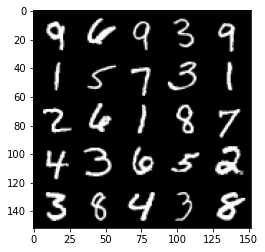

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 76000 : Generator loss: 236.83365643644274, Discriminator loss : 0.5754690759778021, cur_batch_size : 128


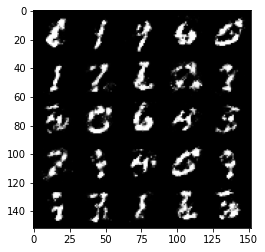

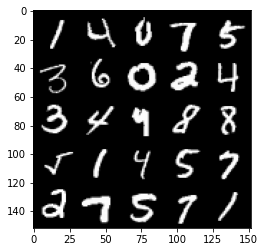

  0%|          | 0/469 [00:00<?, ?it/s]

Step 76500 : Generator loss: 237.73534165012776, Discriminator loss : 0.6074765379428864, cur_batch_size : 128


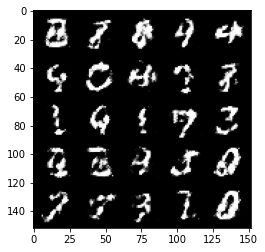

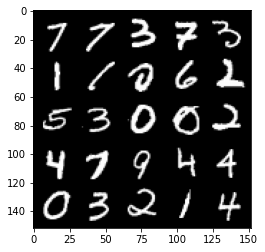

  0%|          | 0/469 [00:00<?, ?it/s]

Step 77000 : Generator loss: 238.64187813293842, Discriminator loss : 0.5721983155608178, cur_batch_size : 128


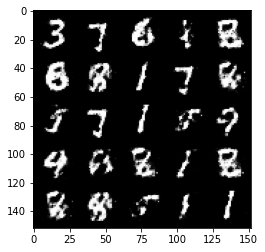

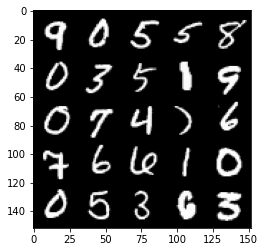

  0%|          | 0/469 [00:00<?, ?it/s]

Step 77500 : Generator loss: 239.5553346613634, Discriminator loss : 0.5715774139165871, cur_batch_size : 128


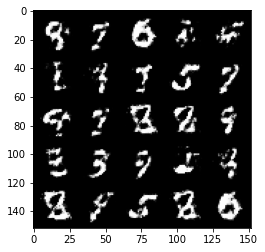

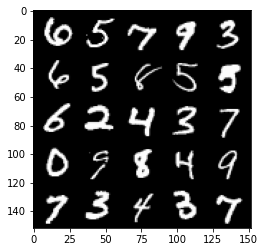

  0%|          | 0/469 [00:00<?, ?it/s]

Step 78000 : Generator loss: 240.5040892437685, Discriminator loss : 0.5622002412676815, cur_batch_size : 128


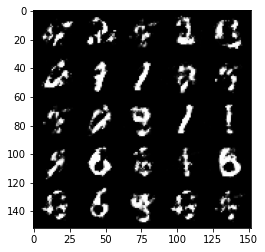

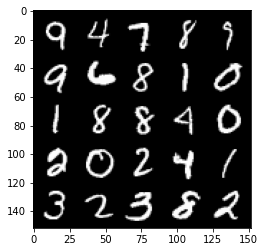

  0%|          | 0/469 [00:00<?, ?it/s]

Step 78500 : Generator loss: 241.44956757175788, Discriminator loss : 0.5778763164281844, cur_batch_size : 128


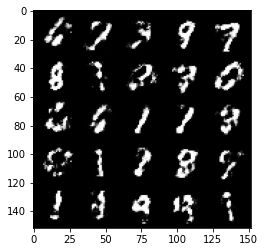

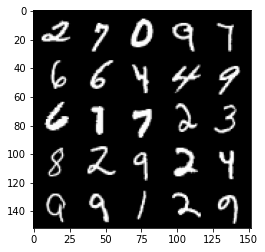

  0%|          | 0/469 [00:00<?, ?it/s]

Step 79000 : Generator loss: 242.37715749239777, Discriminator loss : 0.5650705631375317, cur_batch_size : 128


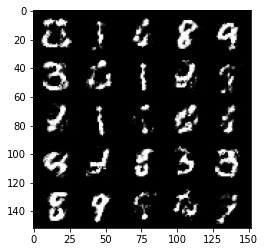

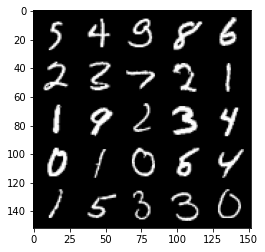

  0%|          | 0/469 [00:00<?, ?it/s]

Step 79500 : Generator loss: 243.31714150965072, Discriminator loss : 0.5396540129184726, cur_batch_size : 128


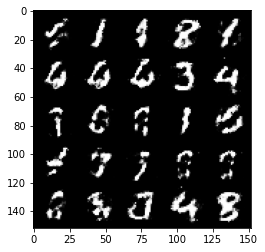

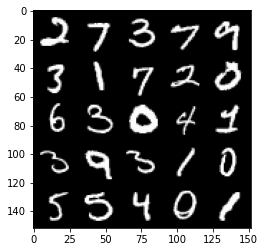

  0%|          | 0/469 [00:00<?, ?it/s]

Step 80000 : Generator loss: 244.29086083566992, Discriminator loss : 0.5552649698257448, cur_batch_size : 128


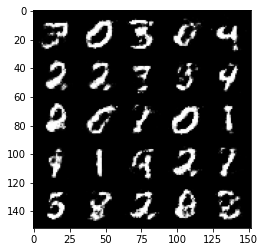

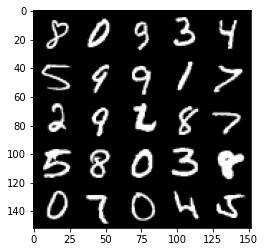

  0%|          | 0/469 [00:00<?, ?it/s]

Step 80500 : Generator loss: 245.26386223089548, Discriminator loss : 0.5614221785068512, cur_batch_size : 128


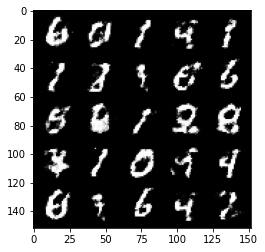

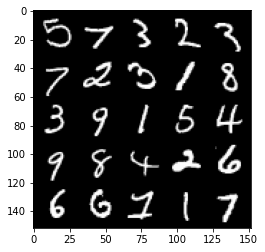

  0%|          | 0/469 [00:00<?, ?it/s]

Step 81000 : Generator loss: 246.22699658310233, Discriminator loss : 0.5638568003773686, cur_batch_size : 128


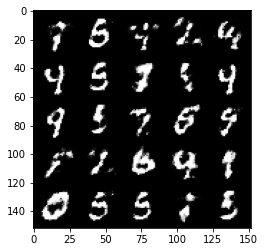

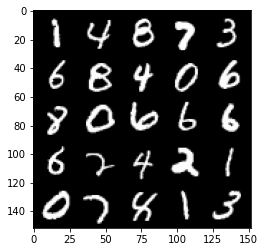

  0%|          | 0/469 [00:00<?, ?it/s]

Step 81500 : Generator loss: 247.18997831845132, Discriminator loss : 0.5558850735425949, cur_batch_size : 128


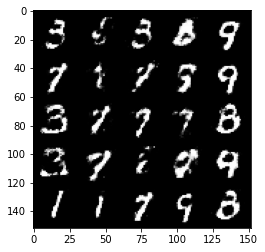

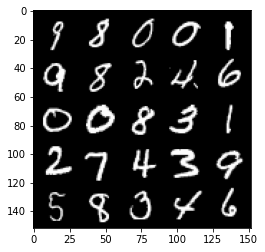

  0%|          | 0/469 [00:00<?, ?it/s]

Step 82000 : Generator loss: 248.1186938855632, Discriminator loss : 0.5956632280945782, cur_batch_size : 128


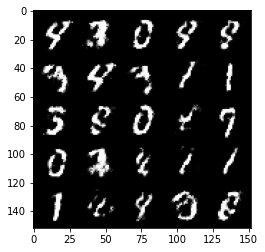

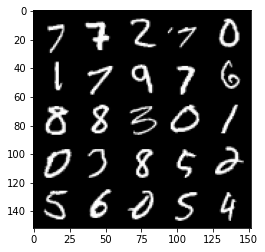

  0%|          | 0/469 [00:00<?, ?it/s]

Step 82500 : Generator loss: 249.0053321801408, Discriminator loss : 0.591250772476196, cur_batch_size : 128


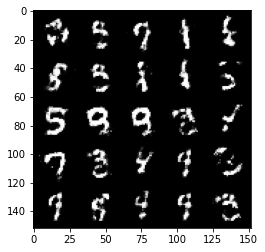

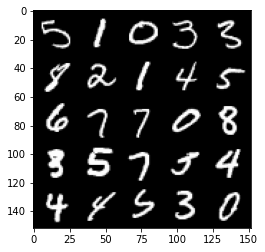

  0%|          | 0/469 [00:00<?, ?it/s]

Step 83000 : Generator loss: 249.92267820834948, Discriminator loss : 0.5670904488563537, cur_batch_size : 128


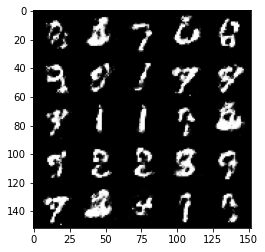

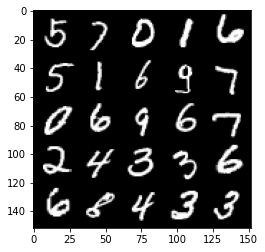

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 83500 : Generator loss: 250.85700606524782, Discriminator loss : 0.5662863401174544, cur_batch_size : 128


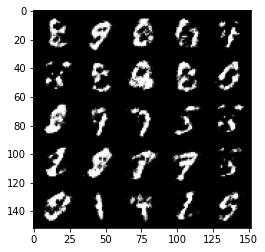

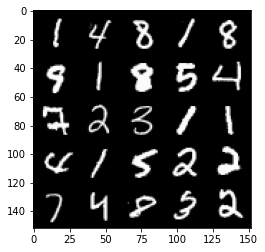

  0%|          | 0/469 [00:00<?, ?it/s]

Step 84000 : Generator loss: 251.7904015035614, Discriminator loss : 0.6036050856113432, cur_batch_size : 128


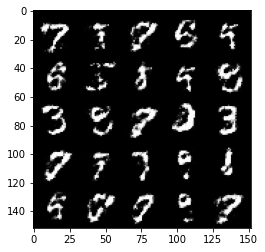

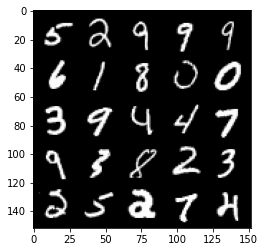

  0%|          | 0/469 [00:00<?, ?it/s]

Step 84500 : Generator loss: 252.68110342466733, Discriminator loss : 0.6101547105312349, cur_batch_size : 128


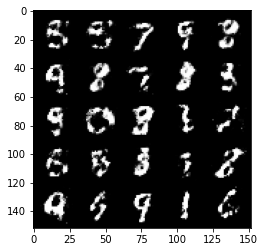

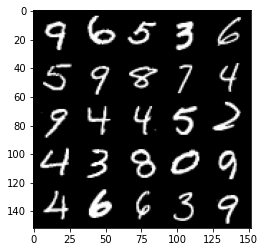

  0%|          | 0/469 [00:00<?, ?it/s]

Step 85000 : Generator loss: 253.56104469096516, Discriminator loss : 0.5976346538066866, cur_batch_size : 128


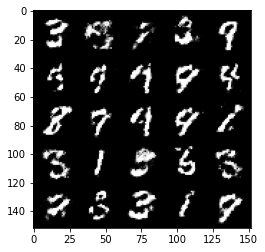

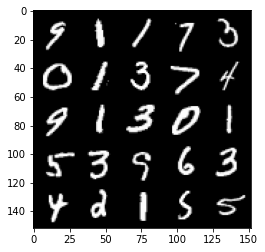

  0%|          | 0/469 [00:00<?, ?it/s]

Step 85500 : Generator loss: 254.46239539074753, Discriminator loss : 0.5880450998544694, cur_batch_size : 128


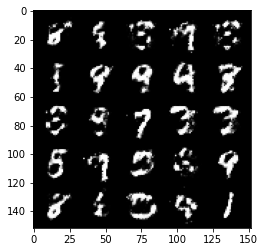

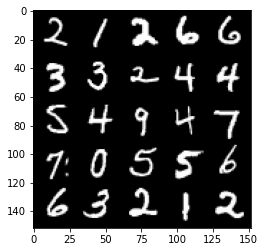

  0%|          | 0/469 [00:00<?, ?it/s]

Step 86000 : Generator loss: 255.35343398701997, Discriminator loss : 0.6039478631019595, cur_batch_size : 128


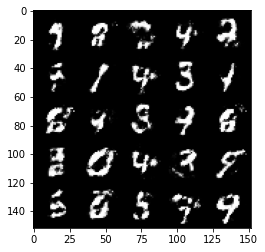

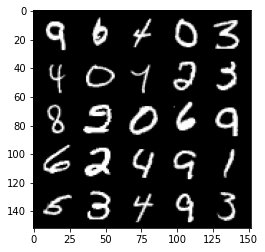

  0%|          | 0/469 [00:00<?, ?it/s]

Step 86500 : Generator loss: 256.2321510708318, Discriminator loss : 0.5927232288122181, cur_batch_size : 128


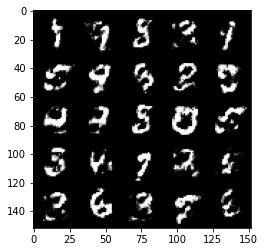

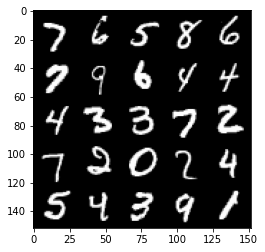

  0%|          | 0/469 [00:00<?, ?it/s]

Step 87000 : Generator loss: 257.1482600792626, Discriminator loss : 0.555278035759926, cur_batch_size : 128


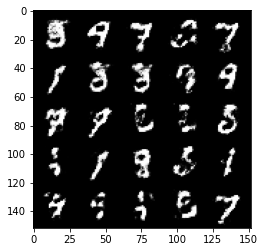

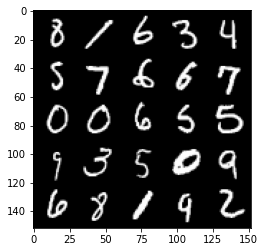

  0%|          | 0/469 [00:00<?, ?it/s]

Step 87500 : Generator loss: 258.0741949735859, Discriminator loss : 0.582386533498764, cur_batch_size : 128


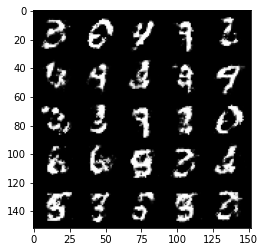

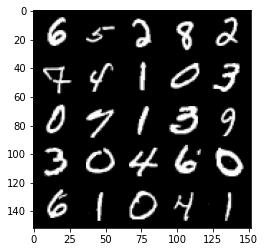

  0%|          | 0/469 [00:00<?, ?it/s]

Step 88000 : Generator loss: 259.0065292998535, Discriminator loss : 0.5605371308922767, cur_batch_size : 128


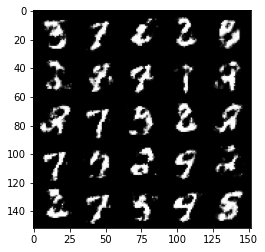

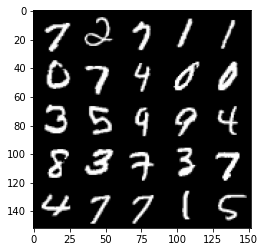

  0%|          | 0/469 [00:00<?, ?it/s]

Step 88500 : Generator loss: 259.9654898430089, Discriminator loss : 0.5791670969128612, cur_batch_size : 128


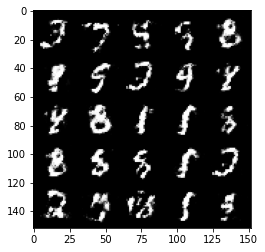

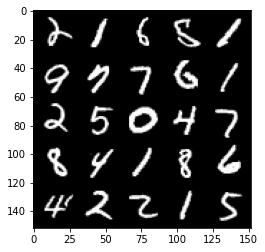

  0%|          | 0/469 [00:00<?, ?it/s]

Step 89000 : Generator loss: 260.8770595970136, Discriminator loss : 0.5772310770750044, cur_batch_size : 128


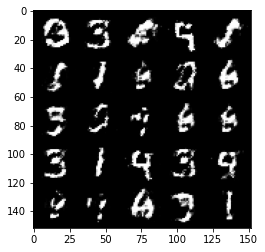

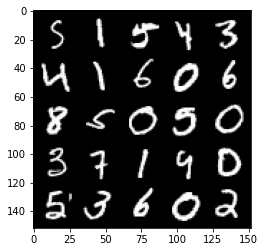

  0%|          | 0/469 [00:00<?, ?it/s]

Step 89500 : Generator loss: 261.7903536922915, Discriminator loss : 0.550089341700077, cur_batch_size : 128


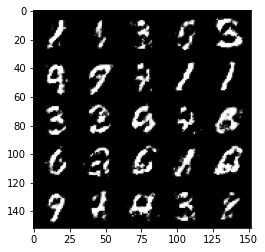

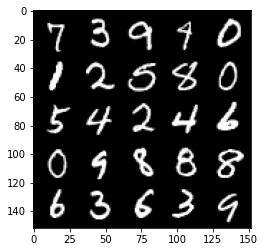

  0%|          | 0/469 [00:00<?, ?it/s]

Step 90000 : Generator loss: 262.74020848190656, Discriminator loss : 0.5516133013367649, cur_batch_size : 128


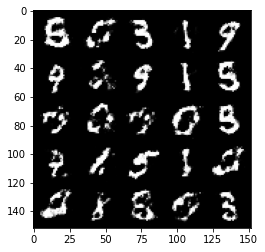

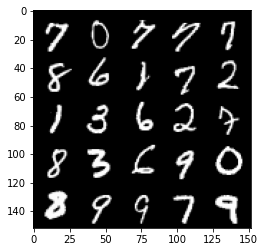

  0%|          | 0/469 [00:00<?, ?it/s]

Step 90500 : Generator loss: 263.7025572904332, Discriminator loss : 0.563404760420322, cur_batch_size : 128


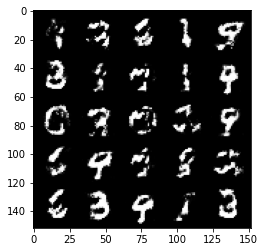

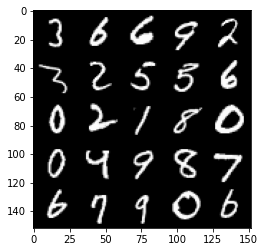

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 91000 : Generator loss: 264.6634226584417, Discriminator loss : 0.5496889911293984, cur_batch_size : 128


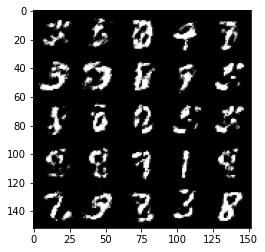

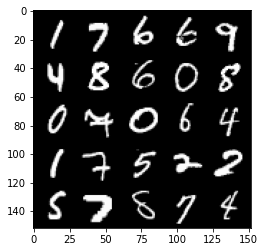

  0%|          | 0/469 [00:00<?, ?it/s]

Step 91500 : Generator loss: 265.62153643631825, Discriminator loss : 0.5700948733091354, cur_batch_size : 128


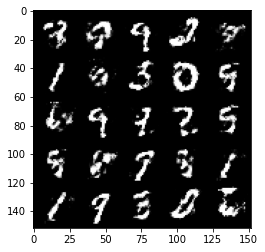

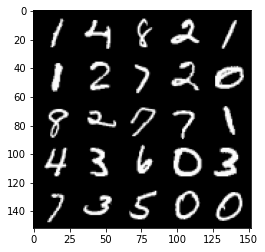

  0%|          | 0/469 [00:00<?, ?it/s]

Step 92000 : Generator loss: 266.5568958297955, Discriminator loss : 0.5694498915076258, cur_batch_size : 128


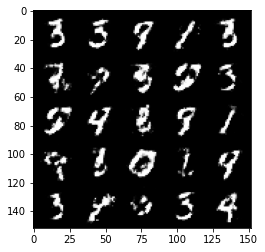

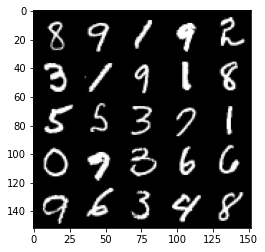

  0%|          | 0/469 [00:00<?, ?it/s]

Step 92500 : Generator loss: 267.4886532561764, Discriminator loss : 0.5921747165918354, cur_batch_size : 128


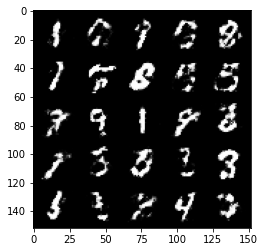

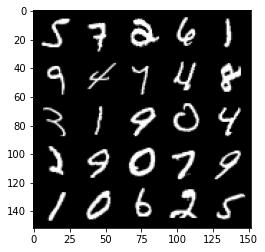

  0%|          | 0/469 [00:00<?, ?it/s]

Step 93000 : Generator loss: 268.3883213034855, Discriminator loss : 0.5842842285633085, cur_batch_size : 128


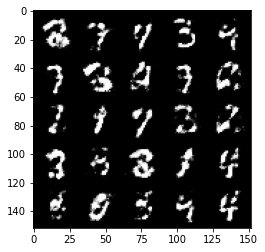

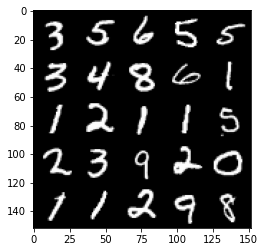

  0%|          | 0/469 [00:00<?, ?it/s]

Step 93500 : Generator loss: 269.29324061381647, Discriminator loss : 0.5732437162399294, cur_batch_size : 128


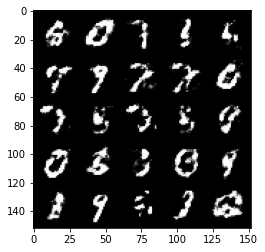

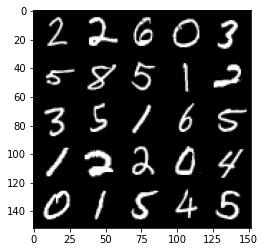

In [27]:
# Train
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True
gen_loss = False
error = False

for epoch in range(n_epochs):
    ## DataLoader returns the batches
    
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        
        ## Flatten the batch of real images from dataset
        real = real.view(cur_batch_size, -1).to(device)
        
        ## Update the discriminator ## 
        # zero out 
        disc_opt.zero_grad()
        
        # calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        
        # update gradients 
        disc_loss.backward(retain_graph=True)
        
        #update optimizer
        disc_opt.step()
        
        ## Update generator
        
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()
        
        ## Keep track of the average disc loss
        mean_discriminator_loss += disc_loss.item() / display_step
        
        ## Keep track of the average gen loss
        mean_generator_loss += gen_loss.item() / display_step
        
        ## Visualizing ## 
        if cur_step % display_step ==0 and cur_step > 0:
            print(f"Step {cur_step} : Generator loss: {mean_generator_loss}, Discriminator loss : {mean_discriminator_loss}, cur_batch_size : {cur_batch_size}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_discriminator_loss = 0
            mean_discriminator_loss = 0
        
        cur_step += 1
            
        

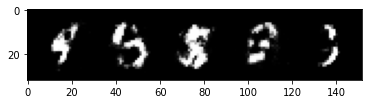

In [33]:
noise = get_noise(5, z_dim, device=device)
fake = gen(noise)
show_tensor_images(fake)